### Notebook for preprocessing and analyzing data from the sentence reading experiment  
Data from Wen, Snell & Grainger (2019). https://doi.org/10.1016/j.cognition.2019.04.013

In [2]:
## import
from tqdm import tqdm
import numpy as np
import glob
import os
import pickle
import scipy
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import scipy.stats as stats 
import seaborn as sns
import mne
from mne.io import read_raw_bdf
from mne.preprocessing.ica import corrmap
import autoreject

### Behavioral analysis (RTs & errors)

In [107]:
data_path = 'E:/Projects/2020_reading/SentenceReading/behavioural_data/'
behav_files=glob.glob(data_path+'/*.txt') # returns logfiles

df=pd.read_csv(behav_files[0], sep='\t', header=0)
correct_indices = np.where(df['correct']==1)
df.head(4)
#print(correct_indices)

,subject_nr,list,item_nr,order,cue,correct
0,2,2,114,2,3,0
1,2,2,151,2,4,1
2,2,2,170,2,4,1
3,2,2,28,1,1,0


In [108]:
err_data = df.groupby(['subject_nr', 'order', 'cue'], as_index=False)['correct'].mean()
err_data['condition'] = err_data['order'].map({1: 'normal', 2: 'scrambled'})
err_data['target_position']=err_data['cue']
#err_data['correct']=1-err_data['correct']

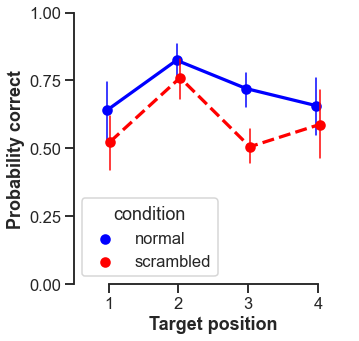

In [109]:
# Initialize the figure
f, ax = plt.subplots(figsize=(5,5))

# Show each observation with a scatterplot
# sns.stripplot(x="target_position", y="correct",  hue='condition',
#               data=err_data, dodge=False, jitter=True,
#               alpha=.4,#order=["1", "2", "3", "4"]
#              )

# Show the conditional means
sns.pointplot(x="target_position", y="correct", hue='condition',
              data=err_data,ci=95,dodge=.05, join=True,errwidth=1.5, palette =['blue', 'red'],
                scale=0.8,bw=.2, linestyles=['-', '--'],
             )


ax.set_yticks([0, 0.25,0.5,0.75, 1])
ax.set_xlabel("Target position",fontdict=dict(weight='bold'))
ax.set_ylabel("Probability correct",fontdict=dict(weight='bold'))

sns.set(style="ticks")
sns.set_context('talk')
sns.color_palette("Paired")
sns.despine(offset=0, trim=True)

In [9]:
err_data.to_csv('E:/Projects/2020_reading/SentenceReading/all_behav.csv') 
# data[data['subj_idx']=="subj_0"].head(10)

In [216]:
# data2savestim = data.drop_duplicates(subset="target").copy(deep=True)
# data2savestim.to_csv('E:/Projects/2020_reading/SentenceReading/stim.csv')

### EEG preprocessing

In [3]:
data_path = "E:/Projects/2020_reading/SentenceReading/EEG/"
EEG_files = glob.glob(data_path+'*.bdf') # returns 40 EEG files
print('there are %i EEG files' %len(EEG_files))

there are 26 EEG files


In [68]:
montage = mne.channels.make_standard_montage(kind='standard_1005')
print(montage)

<DigMontage | 0 extras (headshape), 0 HPIs, 3 fiducials, 343 channels>


  0%|                                                   | 0/26 [00:00<?, ?it/s]

Currently on ppn  1
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub1.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1472511  =      0.000 ...  1437.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8'

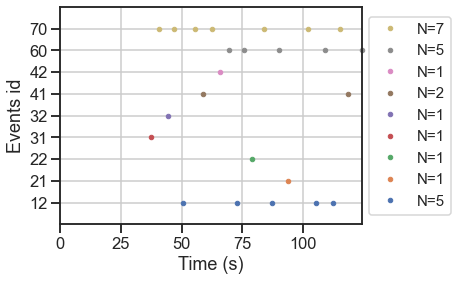

eventcodes:  120
no metadata for participant
120 matching events found
No baseline correction applied
Not setting metadata
Loading data for 120 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 7.3s.
120 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


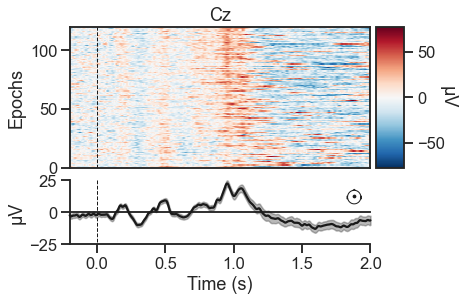

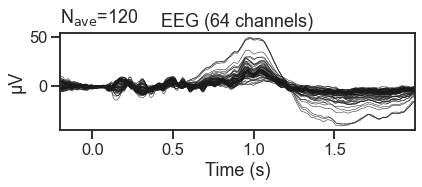

Overwriting existing file.


  4%|█▋                                         | 1/26 [00:18<07:50, 18.81s/it]

Currently on ppn  2
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub2.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2202623  =      0.000 ...  2150.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8'

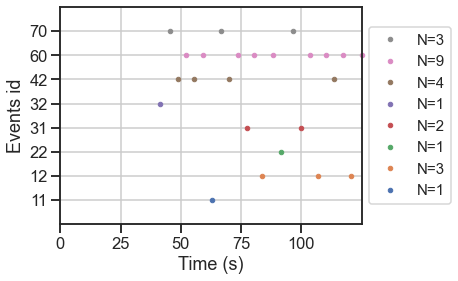

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 10.7s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


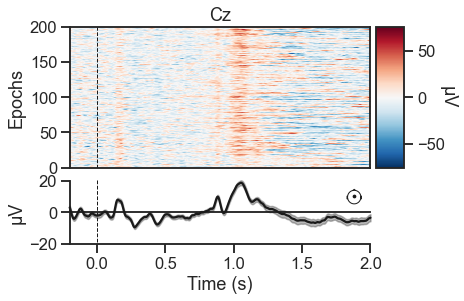

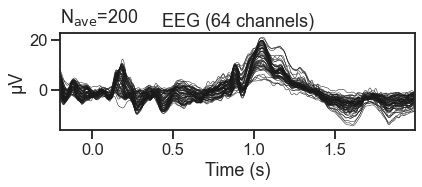

Overwriting existing file.


  8%|███▎                                       | 2/26 [00:49<08:56, 22.34s/it]

Currently on ppn  3
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub3.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2996223  =      0.000 ...  2925.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8'

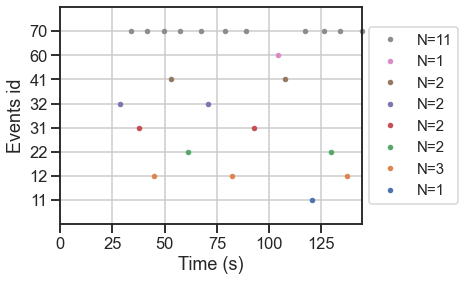

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 722.9s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


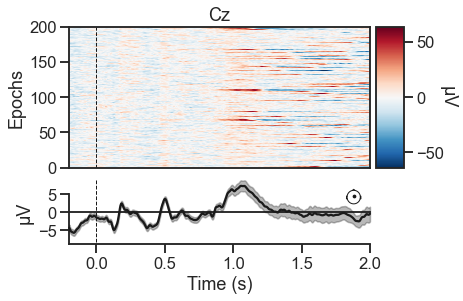

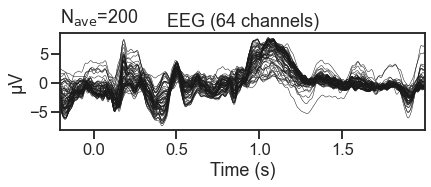

Overwriting existing file.


 12%|████▌                                   | 3/26 [13:16<1:31:53, 239.74s/it]

Currently on ppn  4
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub4.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1845247  =      0.000 ...  1801.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8'

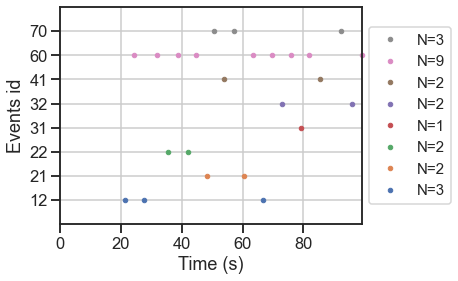

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 10.0s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


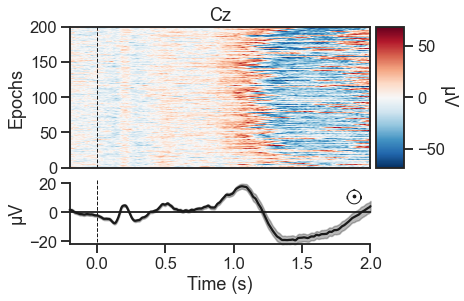

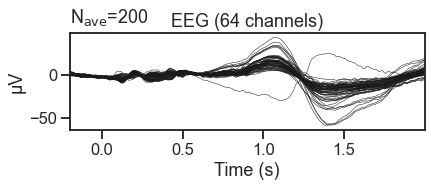

Overwriting existing file.


 15%|██████▏                                 | 4/26 [13:38<1:04:00, 174.56s/it]

Currently on ppn  5
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub5.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2326527  =      0.000 ...  2271.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8'

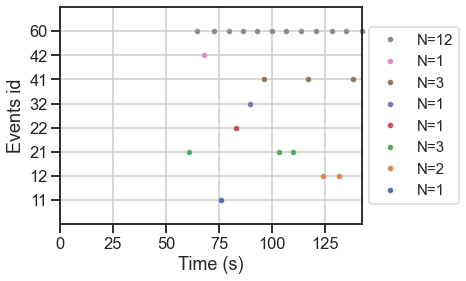

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 6.2s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


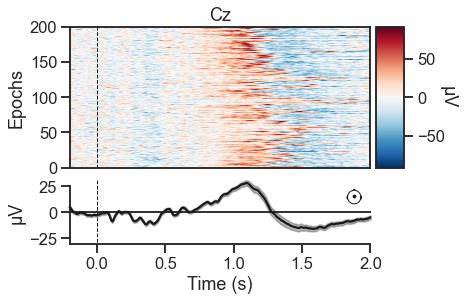

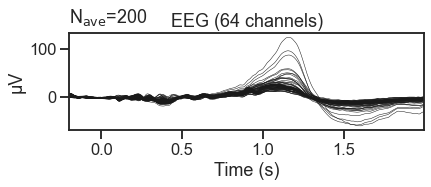

Overwriting existing file.


 19%|████████                                  | 5/26 [13:59<44:57, 128.46s/it]

Currently on ppn  6
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub6.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2241535  =      0.000 ...  2188.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8'

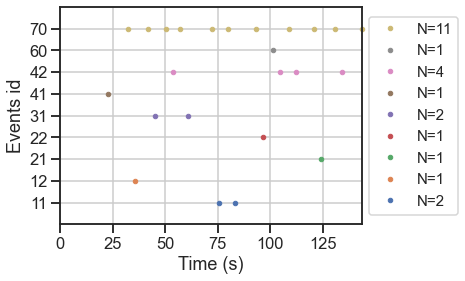

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 5.6s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


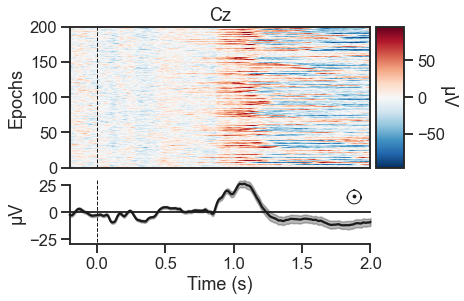

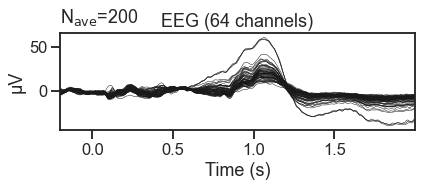

Overwriting existing file.


 23%|█████████▉                                 | 6/26 [14:19<31:54, 95.73s/it]

Currently on ppn  7
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub7.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1910783  =      0.000 ...  1865.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8'

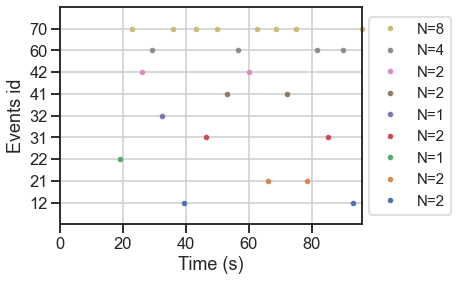

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 10.7s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


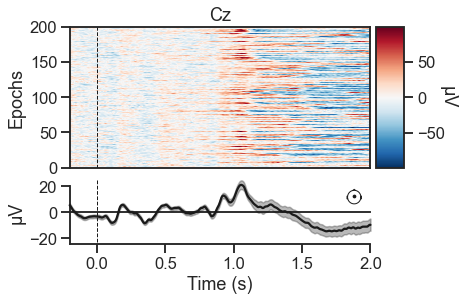

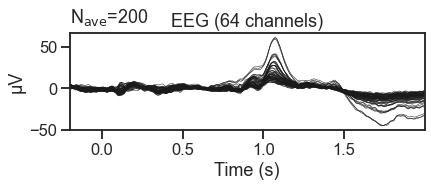

Overwriting existing file.


 27%|███████████▌                               | 7/26 [14:42<23:28, 74.12s/it]

Currently on ppn  8
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub8.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2149375  =      0.000 ...  2098.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8'

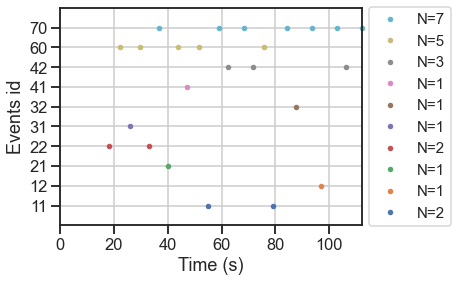

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 7.2s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


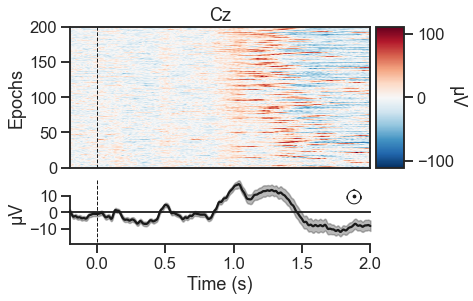

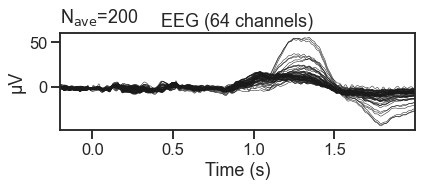

Overwriting existing file.


 31%|█████████████▏                             | 8/26 [15:07<17:49, 59.40s/it]

Currently on ppn  9
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub9.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1807359  =      0.000 ...  1764.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8'

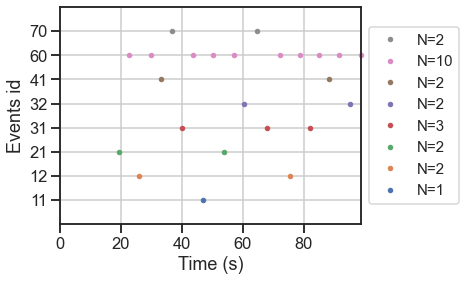

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 6.8s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


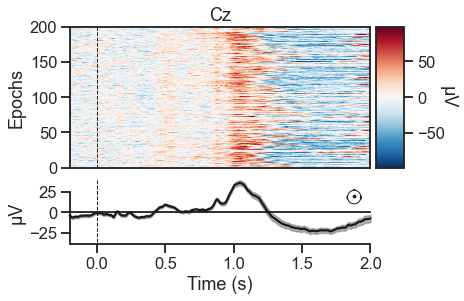

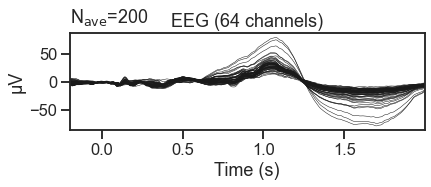

Overwriting existing file.


 35%|██████████████▉                            | 9/26 [15:27<13:26, 47.46s/it]

Currently on ppn  10
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub10.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2236415  =      0.000 ...  2183.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF

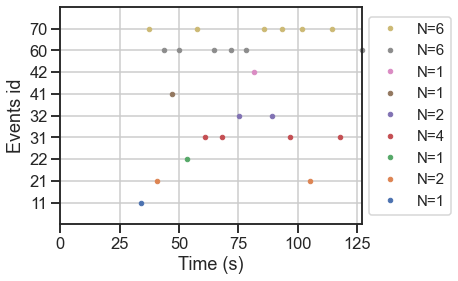

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 10.4s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


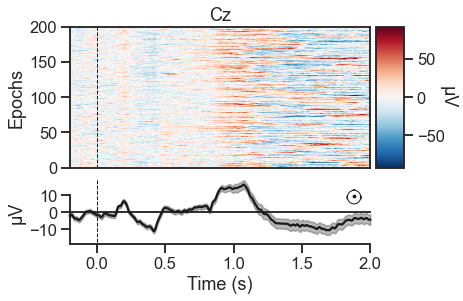

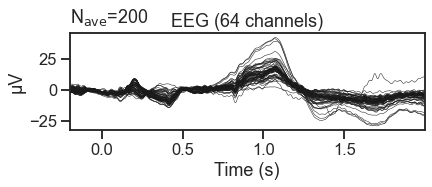

Overwriting existing file.


 38%|████████████████▏                         | 10/26 [15:53<10:54, 40.89s/it]

Currently on ppn  11
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub11.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2312191  =      0.000 ...  2257.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF

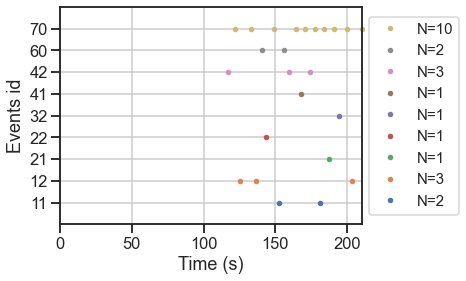

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 11.1s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


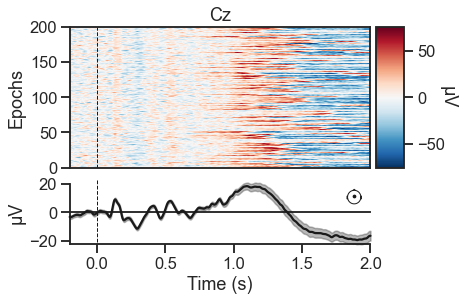

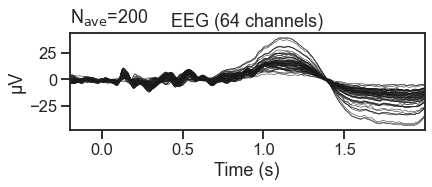

Overwriting existing file.


 42%|█████████████████▊                        | 11/26 [16:20<09:15, 37.00s/it]

Currently on ppn  12
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub12.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2278399  =      0.000 ...  2224.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF

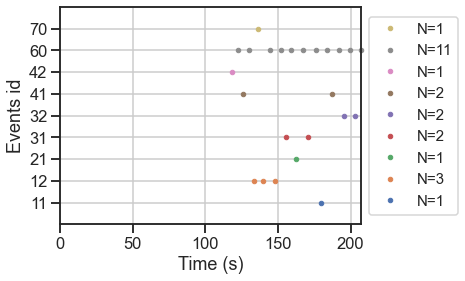

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 11.9s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


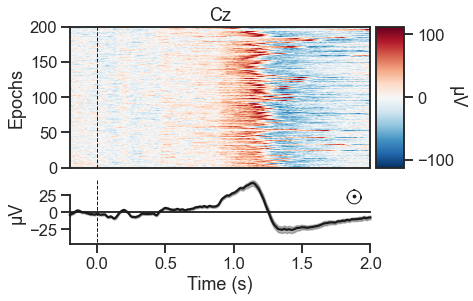

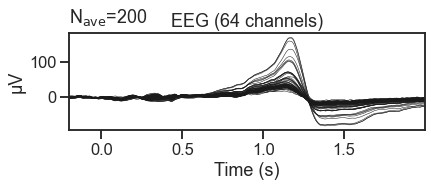

Overwriting existing file.


 46%|███████████████████▍                      | 12/26 [16:47<07:54, 33.87s/it]

Currently on ppn  13
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub13.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2436095  =      0.000 ...  2378.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF

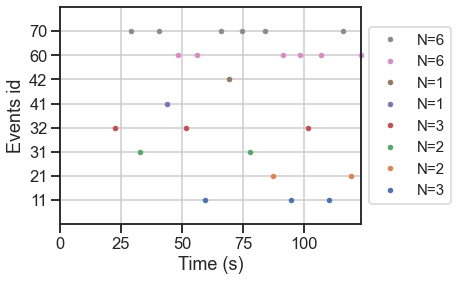

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 6.6s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


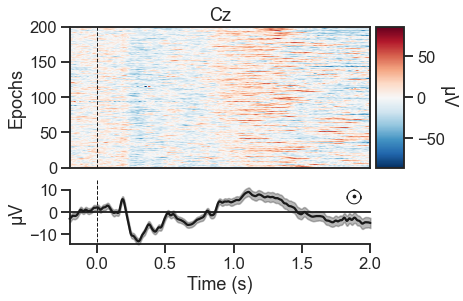

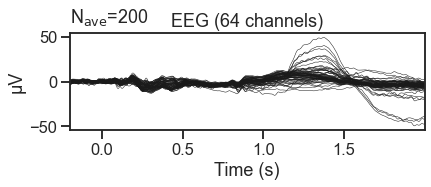

Overwriting existing file.


 50%|█████████████████████                     | 13/26 [17:09<06:32, 30.23s/it]

Currently on ppn  14
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub14.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2038783  =      0.000 ...  1990.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF

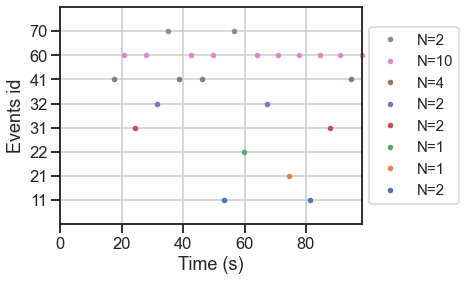

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 5.2s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


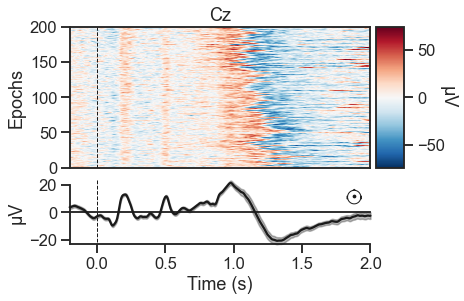

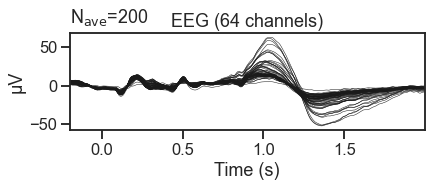

Overwriting existing file.


 54%|██████████████████████▌                   | 14/26 [17:27<05:19, 26.65s/it]

Currently on ppn  15
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub15.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2228223  =      0.000 ...  2175.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF

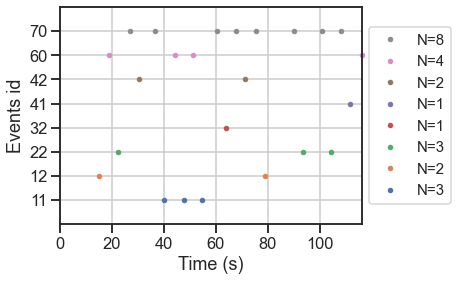

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 4.8s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


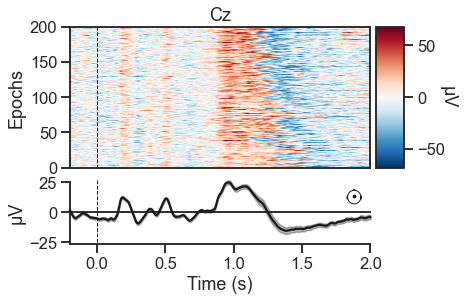

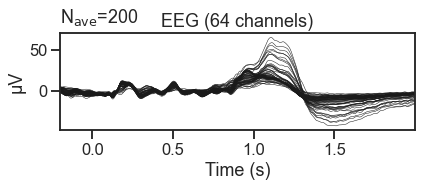

Overwriting existing file.


 58%|████████████████████████▏                 | 15/26 [17:46<04:27, 24.30s/it]

Currently on ppn  16
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub16.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2173951  =      0.000 ...  2122.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF

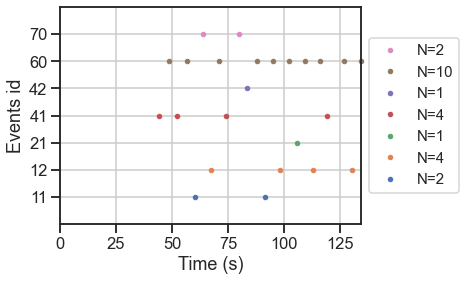

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 5.8s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


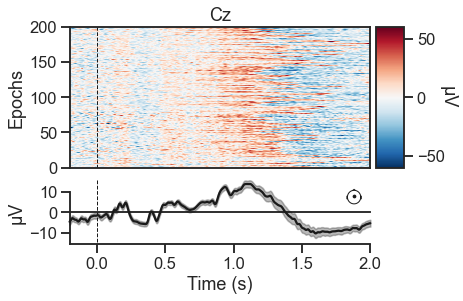

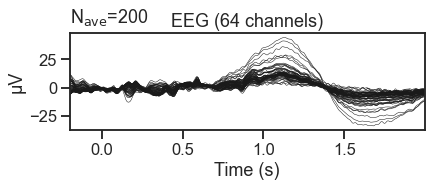

Overwriting existing file.


 62%|█████████████████████████▊                | 16/26 [18:05<03:48, 22.81s/it]

Currently on ppn  17
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub17.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1950719  =      0.000 ...  1904.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF

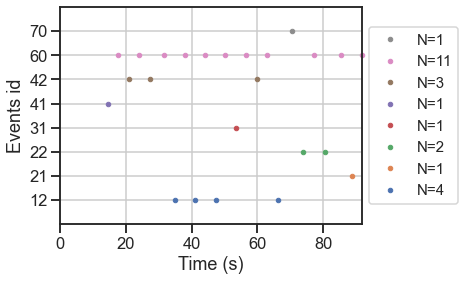

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 5.9s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


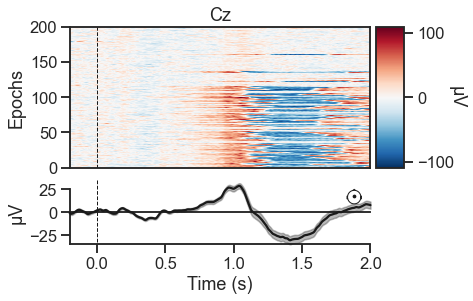

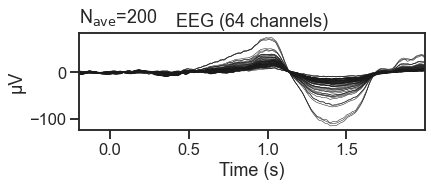

Overwriting existing file.


 65%|███████████████████████████▍              | 17/26 [18:27<03:22, 22.54s/it]

Currently on ppn  18
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub18.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2095103  =      0.000 ...  2045.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF

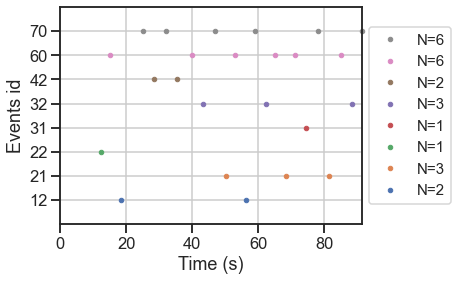

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 7.6s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


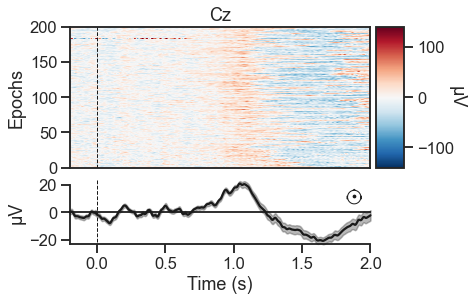

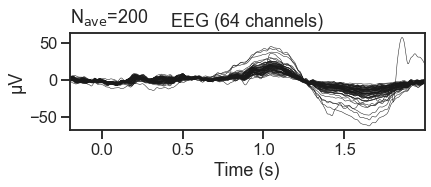

Overwriting existing file.


 69%|█████████████████████████████             | 18/26 [18:49<02:58, 22.34s/it]

Currently on ppn  19
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub19.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2103295  =      0.000 ...  2053.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF

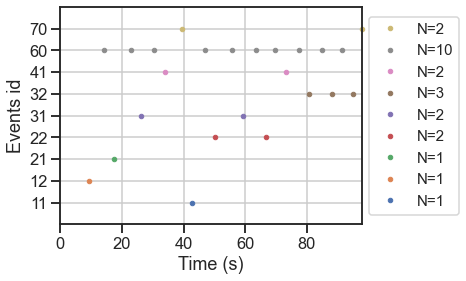

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 6.8s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


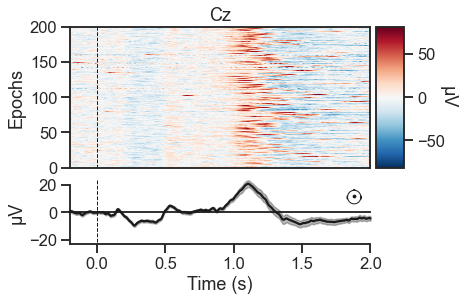

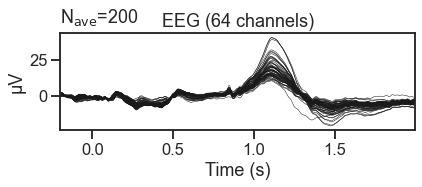

Overwriting existing file.


 73%|██████████████████████████████▋           | 19/26 [19:10<02:34, 22.03s/it]

Currently on ppn  20
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub20.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2215935  =      0.000 ...  2163.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF

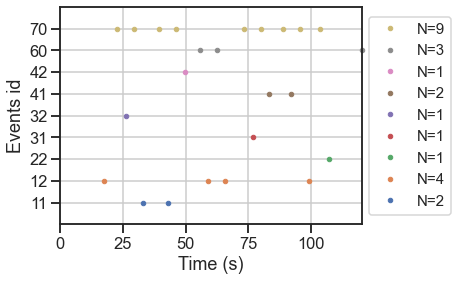

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components


C:\Users\noors\anaconda3\envs\OB1-EEG\lib\site-packages\sklearn\decomposition\_fastica.py:120: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


Fitting ICA took 7911.5s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


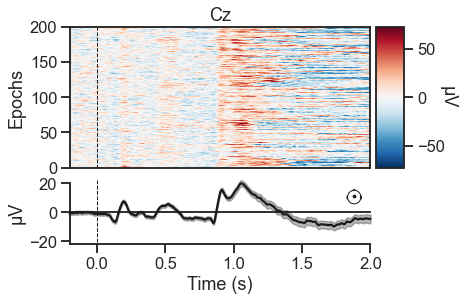

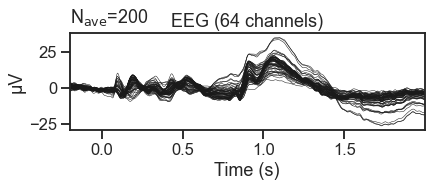

Overwriting existing file.


 77%|███████████████████████████▋        | 20/26 [2:31:17<3:59:20, 2393.47s/it]

Currently on ppn  21
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub21.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2111487  =      0.000 ...  2061.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF

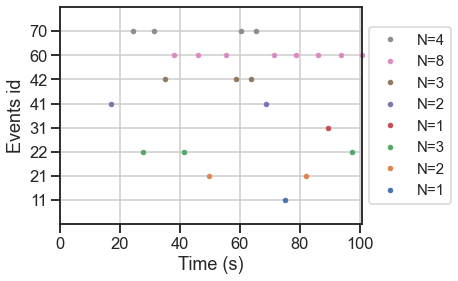

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 7.7s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


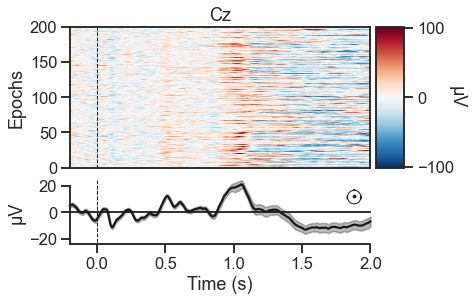

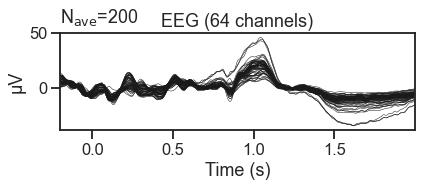

Overwriting existing file.


 81%|█████████████████████████████       | 21/26 [2:31:39<2:20:09, 1681.97s/it]

Currently on ppn  22
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub22.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2294783  =      0.000 ...  2240.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF

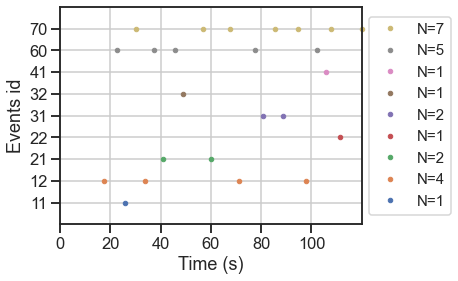

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 8.6s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


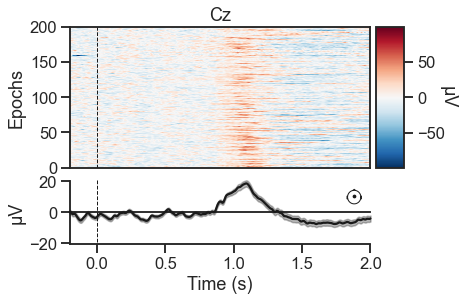

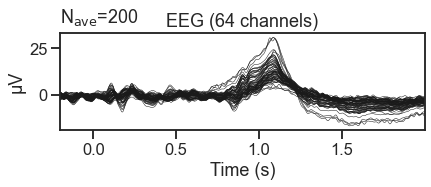

Overwriting existing file.


 85%|██████████████████████████████▍     | 22/26 [2:32:02<1:18:56, 1184.24s/it]

Currently on ppn  23
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub23.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2584575  =      0.000 ...  2523.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF

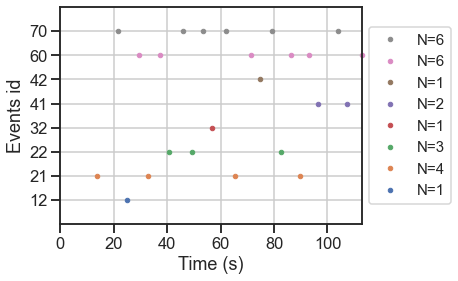

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 6.8s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


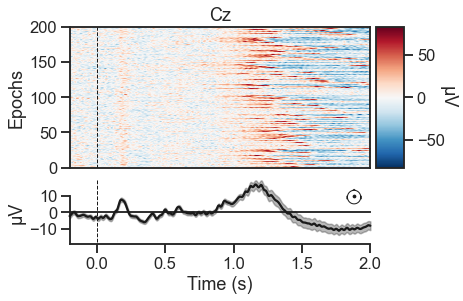

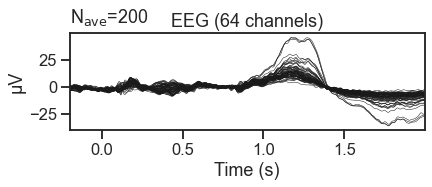

Overwriting existing file.


 88%|██████████████████████████████████▌    | 23/26 [2:32:24<41:47, 835.78s/it]

Currently on ppn  24
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub24.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1993727  =      0.000 ...  1946.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF

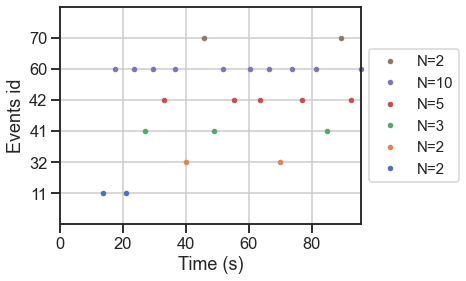

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 6.1s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


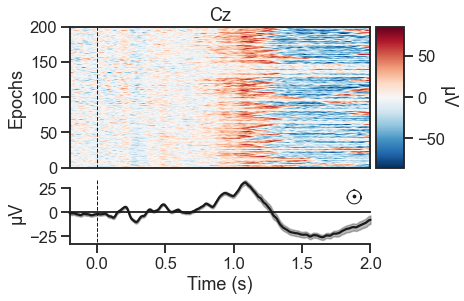

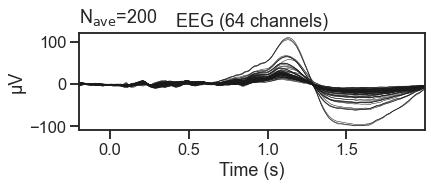

Overwriting existing file.


 92%|████████████████████████████████████   | 24/26 [2:32:43<19:41, 590.74s/it]

Currently on ppn  25
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub25.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2000895  =      0.000 ...  1953.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF

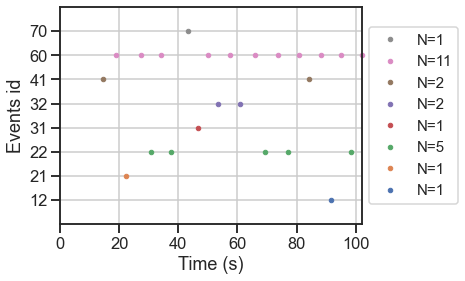

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 6.9s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


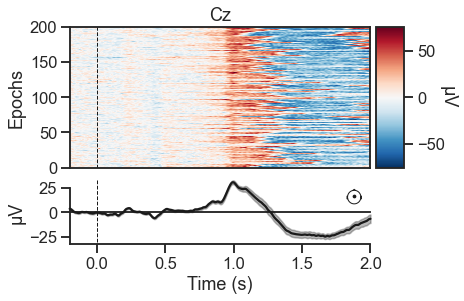

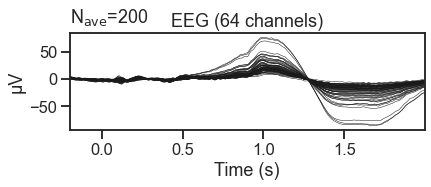

Overwriting existing file.


 96%|█████████████████████████████████████▌ | 25/26 [2:33:03<06:59, 419.45s/it]

Currently on ppn  26
Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub26.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2542591  =      0.000 ...  2482.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF

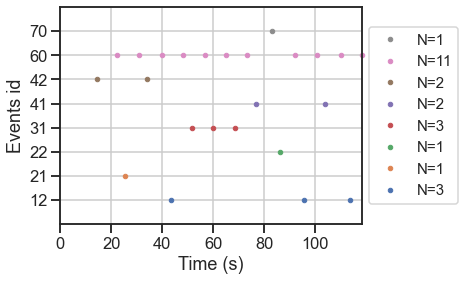

eventcodes:  200
no metadata for participant
200 matching events found
No baseline correction applied
Not setting metadata
Loading data for 200 events and 2254 original time points ...
0 bad epochs dropped
Adding metadata with 1 columns
Fitting ICA to data using 64 channels (please be patient, this may take a while)
Inferring max_pca_components from picks


<ipython-input-69-ebe6d12e46fe>:68: RuntimeWarning: SVD error (SVD did not converge), attempting to use GESVD instead of GESDD
  ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)


Selecting by number: 32 components
Fitting ICA took 8.4s.
200 matching events found
No baseline correction applied
Not setting metadata
0 projection items activated
0 bad epochs dropped


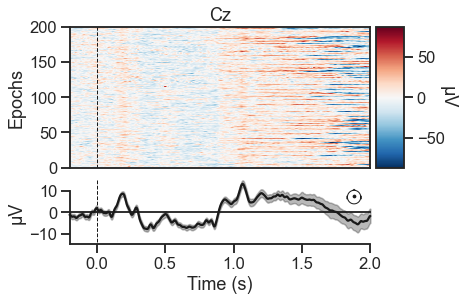

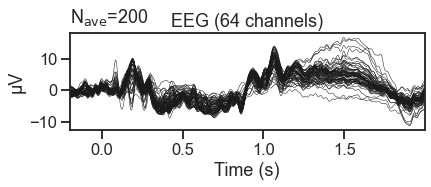

100%|███████████████████████████████████████| 26/26 [2:33:27<00:00, 354.15s/it]


In [69]:
icas_from_all_data=list()

excluded = [1,3,12]

for p in tqdm(range(1,len(EEG_files)+1)): #(0,len(EEG_files))):
    print('Currently on ppn ', p)
    eeg=glob.glob(data_path+'Sub'+str(p)+'.bdf')

#     if p in excluded: #commented to keep participant indices constant during ICA.  
#         continue

    # read in data, referenced to mastoids
    raw = mne.io.read_raw_bdf(eeg[0], 
                              #eog = ['EXG5'], exclude=['L_EOG', 'R_EOG', 'A_EOG', 'B_EOG', 'EXG7', 'EXG8', 'EXG1', 'EXG2', 'EXG3', 'EXG4', 'EXG6', 'EXG5', 'GSR1', 'GSR2', 'Erg1', 'Erg2', 'Resp', 'Plet', 'Temp'],
                              exclude=['F9', 'F10','IO1', 'IO2', 'EXG7', 'EXG8'],
                              preload=True)
    
    raw.set_eeg_reference(['M1', 'M2']) # mastoids as ref    
    raw.set_montage(montage)
   
    print(raw.info['ch_names'])
    print((raw.info['ch_names'][66]))
    pick=raw.info['ch_names'][0:64]
    print(pick)
    pick.append(raw.info['ch_names'][66])
    
    #remove all external electrodes
    raw_wo_ext = raw.copy().pick_channels(pick)
    
    # bandpass filter at 0.5-30Hz
    raw_wo_ext.filter(l_freq=1.,h_freq=30.0)
    
    # identify condition triggers - ignore all response triggers
    events = mne.find_events(raw_wo_ext, stim_channel='Status')
    
    #print(events)
    
    fig = mne.viz.plot_events(events[0:24
                                 ], sfreq=raw.info['sfreq'],
                          first_samp=raw.first_samp)
    fig.subplots_adjust(right=0.7)  # make room for legend
    
    events2 = mne.pick_events(events, include=[11,12,21,22,31,32,41,42])   
    print("eventcodes: ", len(events2))

    metadata = {'eventcodes':events2[:,2]}
    metadata = pd.DataFrame(metadata)
     
    try: 
        df=pd.read_csv('E:/Projects/2020_reading/SentenceReading/behavioural_data/RPVP_behav_data.txt', sep='\t', header=0)
        metadata['subject_nr','list', 'item_nr', 'order','cue','correct']= df[df['subject_nr']==p]['subject_nr','list', 'item_nr', 'order','cue','correct']
    except:
        print('no metadata for participant')

    # epoch data
    epochs = mne.Epochs(raw_wo_ext, events2, tmin=-.2, tmax=2,
                     proj=False, baseline=None,
                     preload=True, 
                     #reject=None,
                     #reject=dict(eeg=180e-6),
                     #reject_by_annotation=False
                   )
    
    epochs.metadata=metadata
    epochs.resample(256, npad='auto')
    
    # run ICA
    ica = mne.preprocessing.ICA(method='fastica', max_iter=100000, n_components=32).fit(epochs)    
    icas_from_all_data.append(ica)

    #epochs.drop_bad(reject=dict(eeg=180e-6))
    epochs.plot_image(picks=['Cz'])
    epochs.average().plot()
    epochs.save('E:/Projects/2020_reading/SentenceReading/EEG/' + 'pp_' + str(p) + '_beforeICA-epo.fif', overwrite=True)

    del raw, raw_wo_ext, events,events2, epochs, ica
    

In [70]:
with open('E:/Projects/2020_reading/SentenceReading/ica_all_data', 'wb') as f:
    pickle.dump(icas_from_all_data, f)

In [71]:
with open('E:/Projects/2020_reading/SentenceReading/ica_all_data', 'rb') as f:
    icas_from_all_data = pickle.load(f)

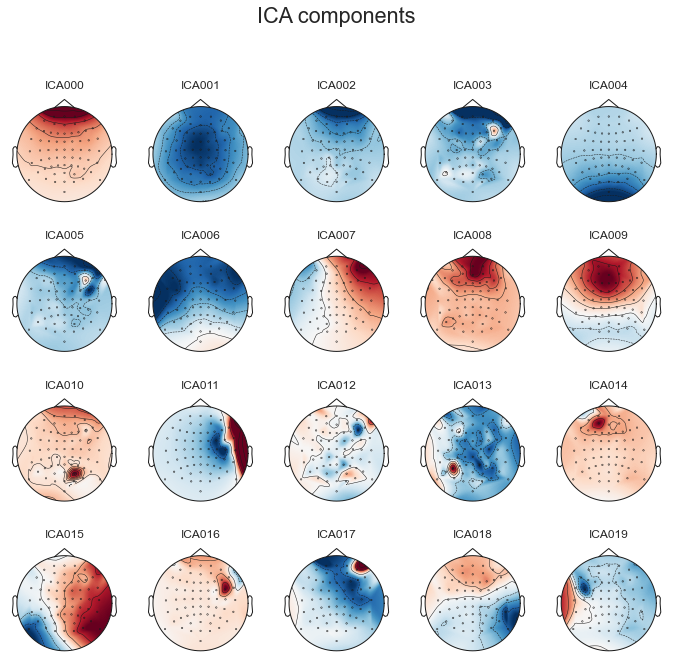

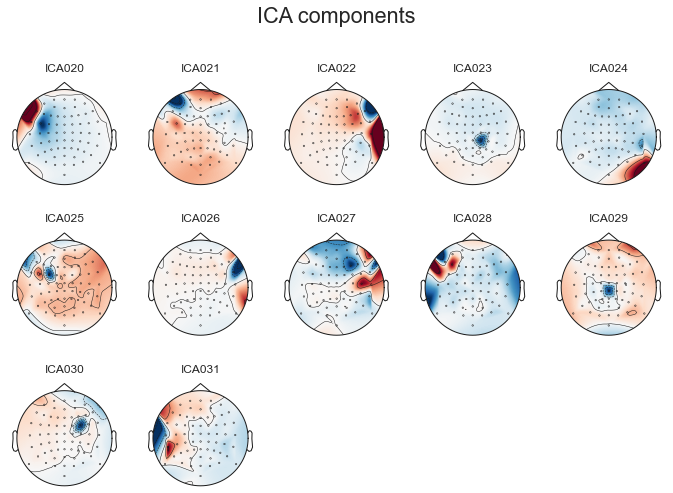

[<Figure size 702x678.24 with 20 Axes>, <Figure size 702x508.68 with 12 Axes>]

In [72]:
pp=17
reference_ica = icas_from_all_data[pp+1]
reference_ica.plot_components()

In [73]:
template = (18, 0)

Median correlation with constructed map: 0.941
Displaying selected ICs per subject.
At least 1 IC detected for each subject.


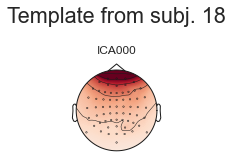

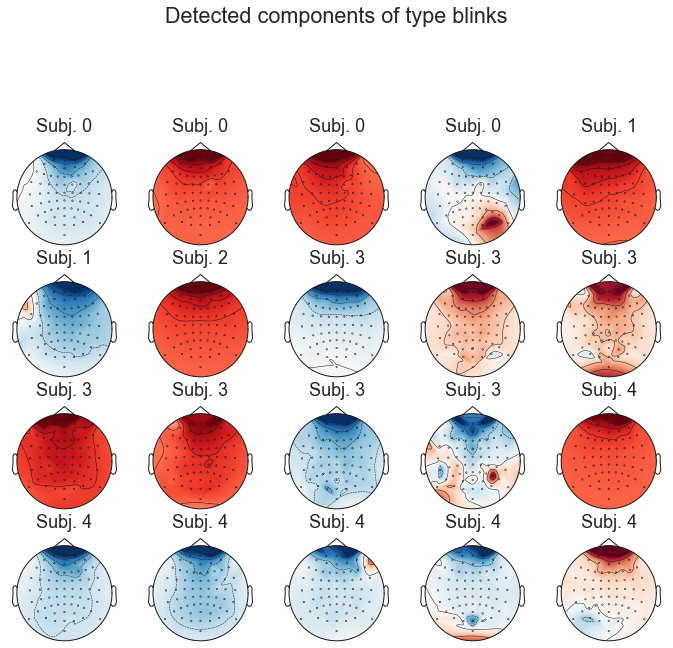

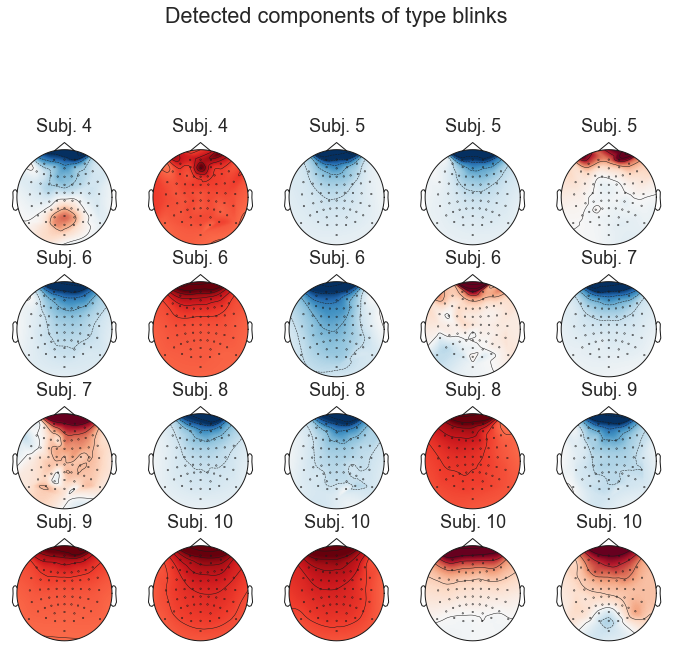

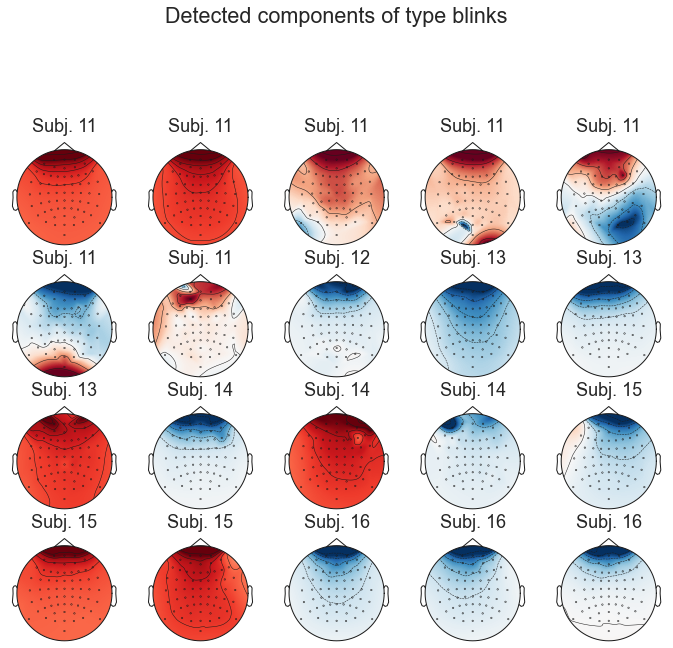

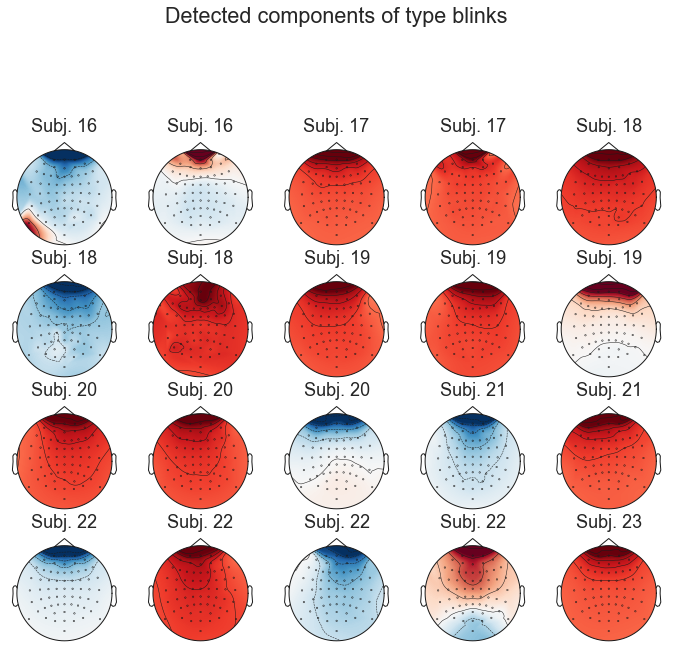

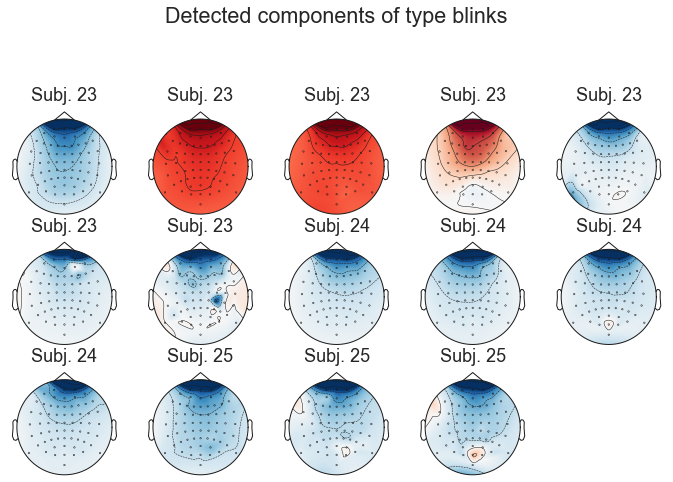

In [74]:
fig_template, fig_detected = mne.preprocessing.corrmap(icas_from_all_data, template=template, label='blinks',
                                                      show=False, threshold=.8)

In [75]:
template = (18, 7)

Median correlation with constructed map: 0.963
Displaying selected ICs per subject.
No maps selected for subjects [0, 1, 3, 5, 6, 8, 9, 10, 12, 15, 16, 17, 19, 20, 22, 24, 25], consider a more liberal threshold.


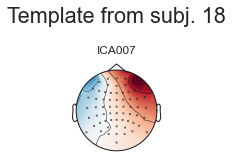

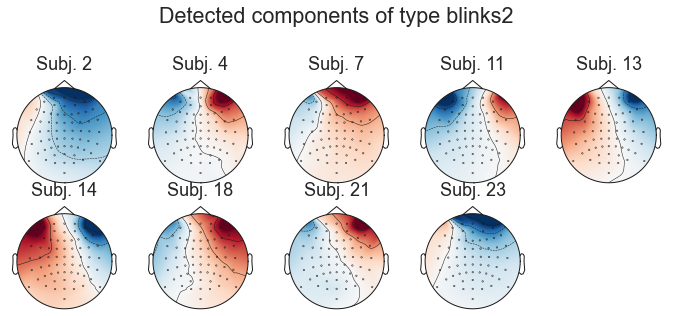

In [76]:
fig_template, fig_detected = mne.preprocessing.corrmap(icas_from_all_data, template=template, label='blinks2',
                                                      show=False, threshold=.8)

  0%|                                                   | 0/26 [00:00<?, ?it/s]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub2.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2202623  =      0.000 ...  2150.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz'

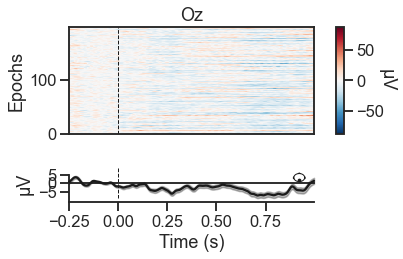

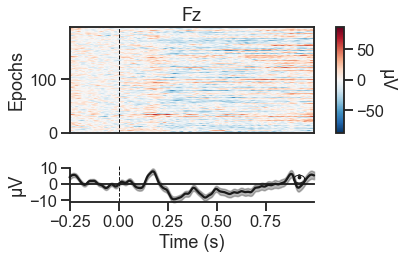

Overwriting existing file.


  8%|███▎                                       | 2/26 [00:23<04:47, 11.98s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub4.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1845247  =      0.000 ...  1801.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz'

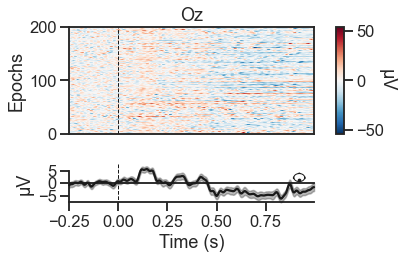

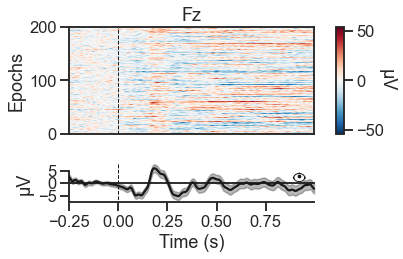

Overwriting existing file.


 15%|██████▌                                    | 4/26 [00:42<04:06, 11.21s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub5.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2326527  =      0.000 ...  2271.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz'

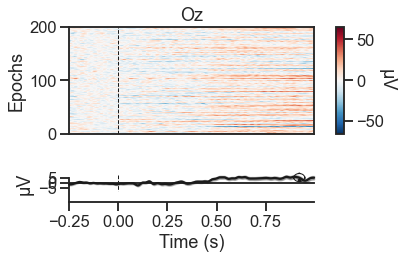

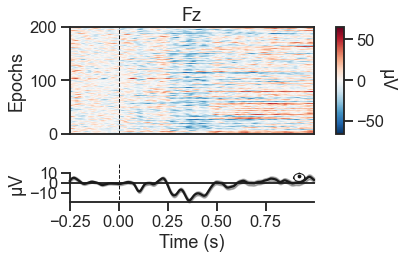

Overwriting existing file.


 19%|████████▎                                  | 5/26 [01:05<05:04, 14.52s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub6.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2241535  =      0.000 ...  2188.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz'

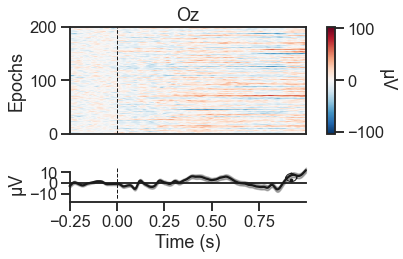

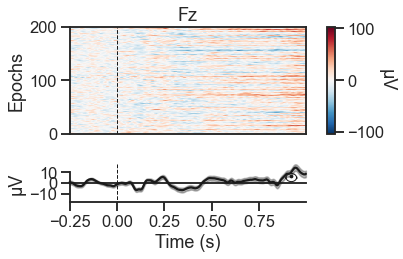

Overwriting existing file.


 23%|█████████▉                                 | 6/26 [01:26<05:34, 16.74s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub7.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1910783  =      0.000 ...  1865.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz'

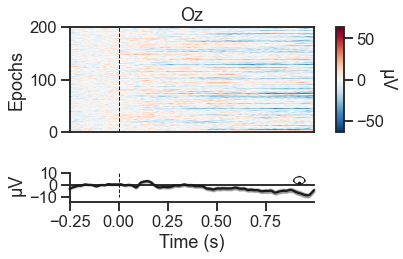

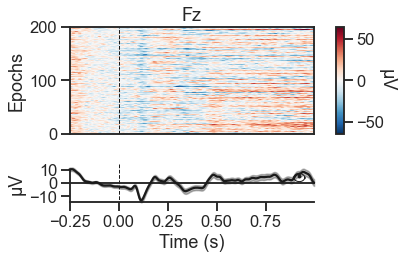

Overwriting existing file.


 27%|███████████▌                               | 7/26 [01:46<05:34, 17.58s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub8.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2149375  =      0.000 ...  2098.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz'

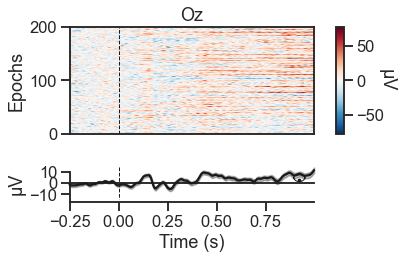

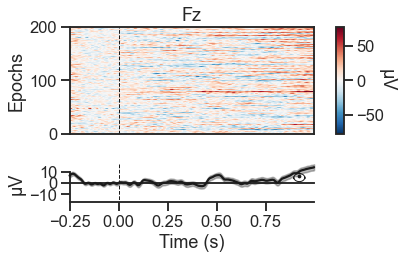

Overwriting existing file.


 31%|█████████████▏                             | 8/26 [02:07<05:34, 18.59s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub9.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1807359  =      0.000 ...  1764.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz'

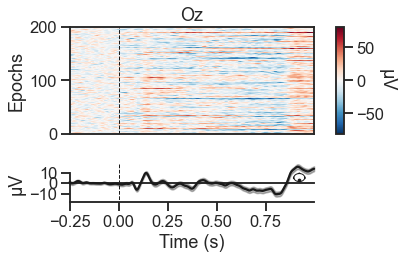

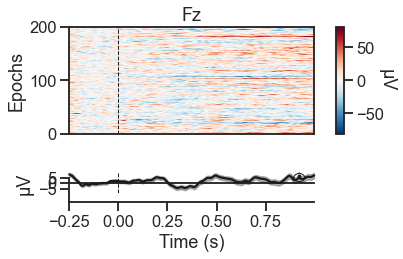

Overwriting existing file.


 35%|██████████████▉                            | 9/26 [02:25<05:11, 18.35s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub10.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2236415  =      0.000 ...  2183.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz

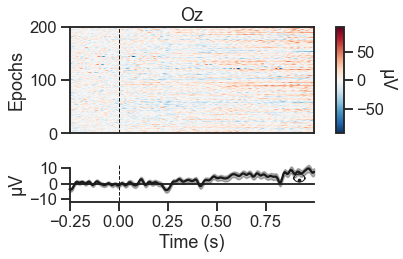

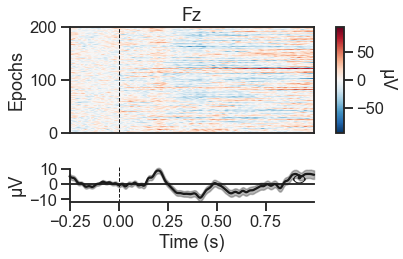

Overwriting existing file.


 38%|████████████████▏                         | 10/26 [02:46<05:06, 19.13s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub11.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2312191  =      0.000 ...  2257.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz

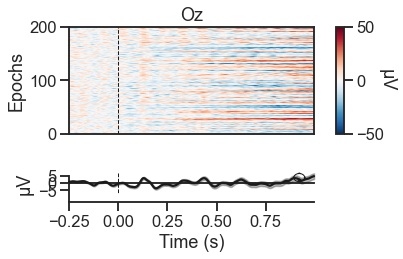

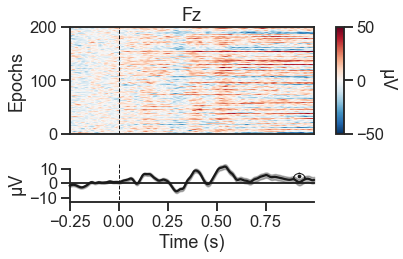

Overwriting existing file.


 42%|█████████████████▊                        | 11/26 [03:07<04:58, 19.90s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub13.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2436095  =      0.000 ...  2378.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz

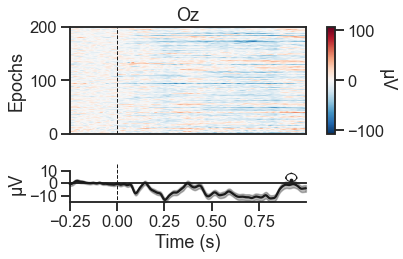

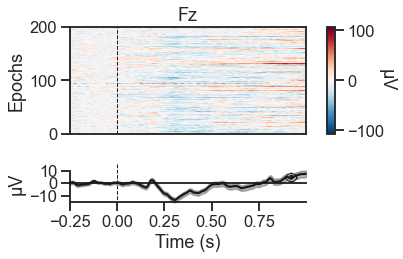

Overwriting existing file.


 50%|█████████████████████                     | 13/26 [03:35<03:54, 18.06s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub14.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2038783  =      0.000 ...  1990.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz

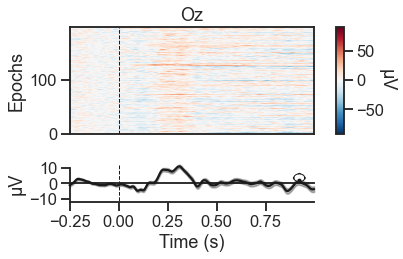

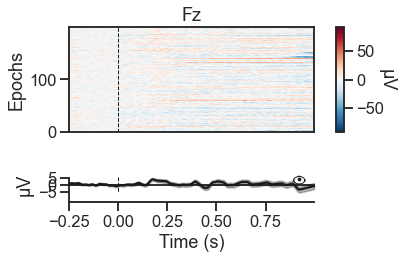

Overwriting existing file.


 54%|██████████████████████▌                   | 14/26 [03:54<03:41, 18.45s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub15.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2228223  =      0.000 ...  2175.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz

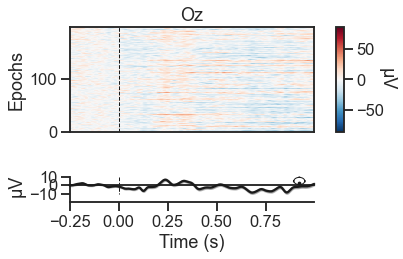

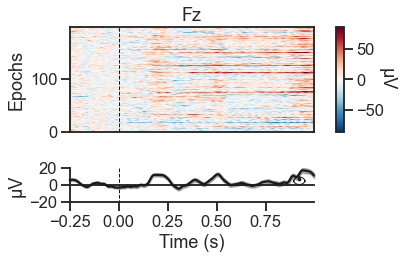

Overwriting existing file.


 58%|████████████████████████▏                 | 15/26 [04:15<03:31, 19.27s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub16.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2173951  =      0.000 ...  2122.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz

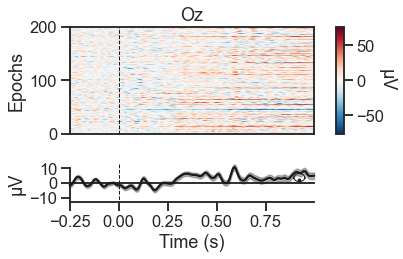

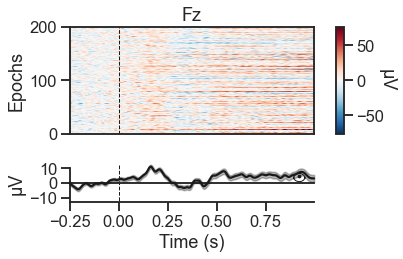

Overwriting existing file.


 62%|█████████████████████████▊                | 16/26 [04:36<03:16, 19.62s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub17.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1950719  =      0.000 ...  1904.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz

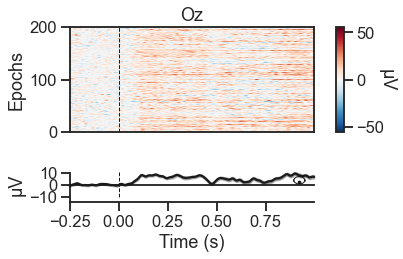

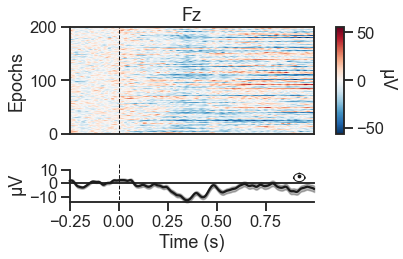

Overwriting existing file.


 65%|███████████████████████████▍              | 17/26 [04:54<02:53, 19.25s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub18.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2095103  =      0.000 ...  2045.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz

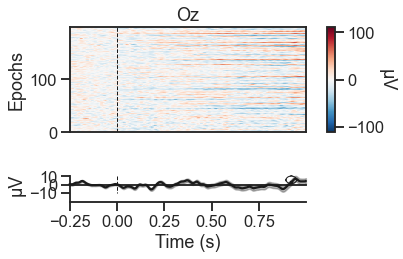

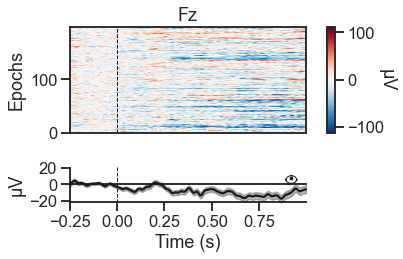

Overwriting existing file.


 69%|█████████████████████████████             | 18/26 [05:14<02:34, 19.30s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub19.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2103295  =      0.000 ...  2053.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz

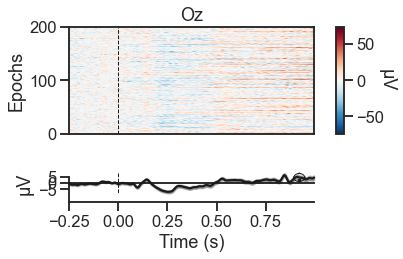

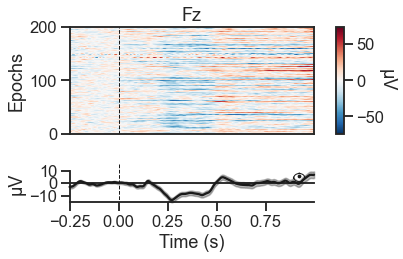

Overwriting existing file.


 73%|██████████████████████████████▋           | 19/26 [05:33<02:15, 19.32s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub20.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2215935  =      0.000 ...  2163.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz

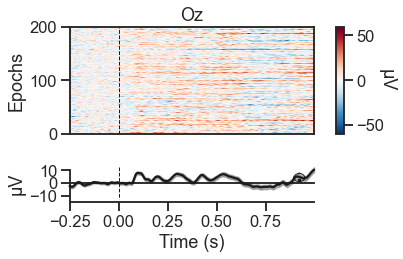

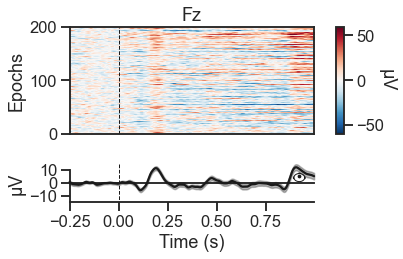

Overwriting existing file.


 77%|████████████████████████████████▎         | 20/26 [05:55<02:01, 20.18s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub21.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2111487  =      0.000 ...  2061.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz

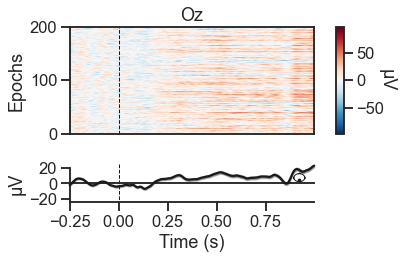

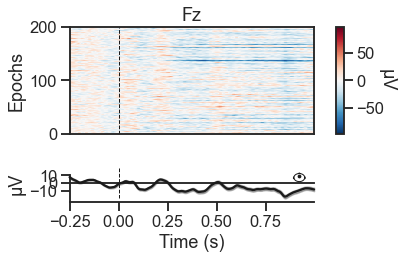

Overwriting existing file.


 81%|█████████████████████████████████▉        | 21/26 [06:16<01:42, 20.46s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub22.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2294783  =      0.000 ...  2240.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz

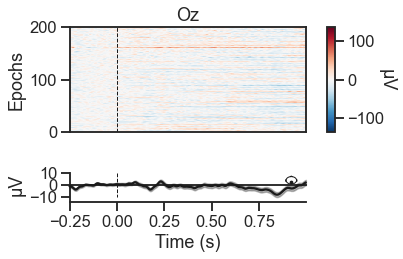

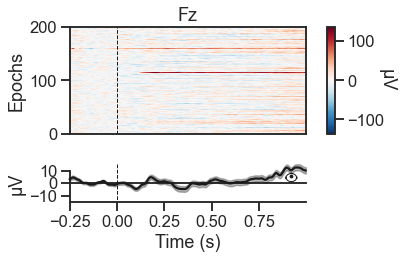

Overwriting existing file.


 85%|███████████████████████████████████▌      | 22/26 [06:38<01:23, 20.85s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub23.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2584575  =      0.000 ...  2523.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz

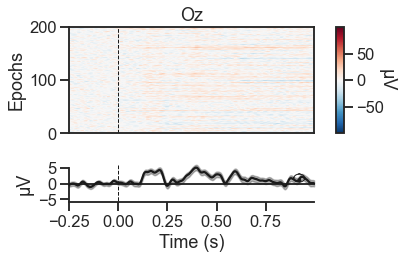

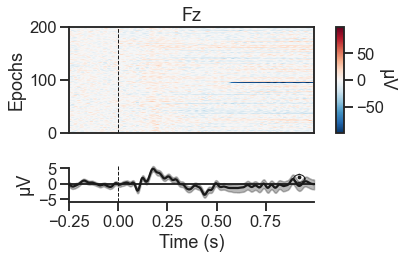

Overwriting existing file.


 88%|█████████████████████████████████████▏    | 23/26 [07:04<01:06, 22.33s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub24.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 1993727  =      0.000 ...  1946.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz

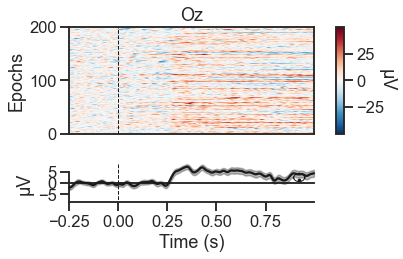

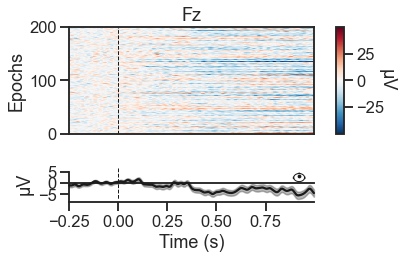

Overwriting existing file.


 92%|██████████████████████████████████████▊   | 24/26 [07:21<00:41, 20.89s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub25.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2000895  =      0.000 ...  1953.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz

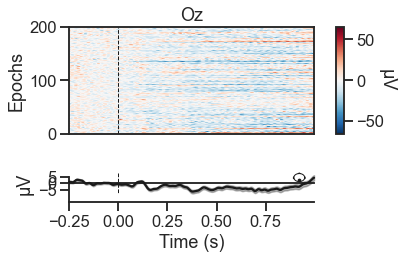

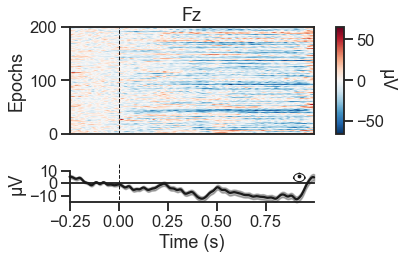

Overwriting existing file.


 96%|████████████████████████████████████████▍ | 25/26 [07:39<00:19, 19.76s/it]

Extracting EDF parameters from E:\Projects\2020_reading\SentenceReading\EEG\Sub26.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2542591  =      0.000 ...  2482.999 secs...
EEG channel type selected for re-referencing
Applying a custom EEG reference.
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz', 'F2', 'F4', 'F6', 'F8', 'FT8', 'FC6', 'FC4', 'FC2', 'FCz', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 'CP2', 'P2', 'P4', 'P6', 'P8', 'P10', 'PO8', 'PO4', 'O2', 'M1', 'M2', 'Status']
Status
['Fp1', 'AF7', 'AF3', 'F1', 'F3', 'F5', 'F7', 'FT7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5', 'CP3', 'CP1', 'P1', 'P3', 'P5', 'P7', 'P9', 'PO7', 'PO3', 'O1', 'Iz', 'Oz', 'POz', 'Pz', 'CPz', 'Fpz', 'Fp2', 'AF8', 'AF4', 'AFz', 'Fz

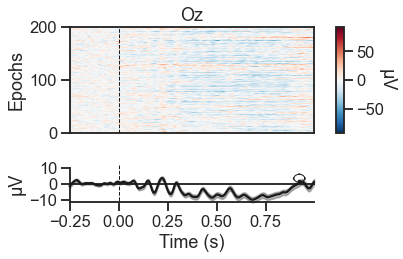

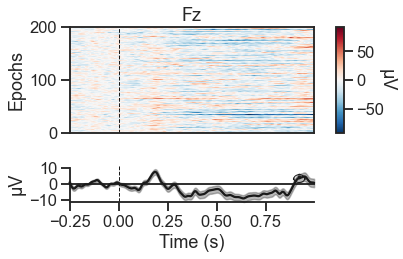

Overwriting existing file.


100%|██████████████████████████████████████████| 26/26 [08:00<00:00, 18.48s/it]


In [108]:
# second loop to apply ica & drop bad epochs
df=pd.read_csv('E:/Projects/2020_reading/SentenceReading/behavioural_data/RPVP_behav_data.txt', sep='\t', header=0)

for p in tqdm(range(1,len(EEG_files)+1)):
    
    if p in excluded:  
        continue
        
    eeg=glob.glob(data_path+'Sub'+str(p)+'.bdf')

     # read in data, referenced to mastoids
    raw = mne.io.read_raw_bdf(eeg[0], 
                              #eog = ['EXG5'], exclude=['L_EOG', 'R_EOG', 'A_EOG', 'B_EOG', 'EXG7', 'EXG8', 'EXG1', 'EXG2', 'EXG3', 'EXG4', 'EXG6', 'EXG5', 'GSR1', 'GSR2', 'Erg1', 'Erg2', 'Resp', 'Plet', 'Temp'],
                              exclude=['F9','F10','IO1', 'IO2', 'EXG7', 'EXG8'],
                              preload=True)
    
    raw.set_eeg_reference(['M1', 'M2']) # mastoids as ref    
    raw.set_montage(montage)
   
    print(raw.info['ch_names'])
    print((raw.info['ch_names'][66]))
    pick=raw.info['ch_names'][0:64]
    print(pick)
    pick.append(raw.info['ch_names'][66])
    
    #remove all external electrodes
    raw_wo_ext = raw.copy().pick_channels(pick)
    
    # bandpass filter at 0.1-30Hz
    raw_wo_ext.filter(l_freq=.1, h_freq=30.0)
    
    # load precomputed ICA -- p-1 because loop starts at 1 (no zero-indexing)
    ica = icas_from_all_data[p-1]
    
    # load blink component found with corrmap
    blink = icas_from_all_data[p-1].labels_['blinks']
    blink2 = icas_from_all_data[p-1].labels_['blinks2']   
    
    # remove blink component -- extend because sometimes there is more than 1 component 
    ica.exclude.extend(blink)
    ica.exclude.extend(blink2)
    ica.apply(raw_wo_ext)
    
    
    # identify condition triggers - ignore all response triggers
        # identify condition triggers - ignore all response triggers
    events = mne.find_events(raw_wo_ext, stim_channel='Status')
    events2 = mne.pick_events(events, include=[11,12,21,22,31,32,41,42])   
    print("eventcodes: ", len(events2))

    metadata = {'eventcodes':events2[:,2]}
    metadata = pd.DataFrame(metadata)
    
    df_p=df[df['subject_nr']==p].reset_index(drop=True).copy(deep=True)
    print(df_p.head(3))
    metadata[['subject_nr','list', 'item_nr', 'order','cue','correct']]= df_p[['subject_nr','list', 'item_nr', 'order','cue','correct']]

    
    print(metadata.head(3))
        
    # epoch data
    epochs = mne.Epochs(raw_wo_ext, events2, tmin=-.25, tmax=1,
                     proj=False, baseline=(-.2, 0),
                     preload=True, 
                     reject=None,
                     picks=["Fz", "POz", "Cz", "Oz"]
                     #reject=dict(eeg=180e-6)
                   )

    
    epochs.metadata=metadata
    print(metadata)
    
    epochs.resample(256, npad='auto')
    epochs.drop_bad(reject=dict(eeg=180e-6))
    
    epochs.plot_image(picks=['Oz', 'Fz'])
   
    epochs.save('E:/Projects/2020_reading/SentenceReading/EEG/' + 'pp_' + str(p) + '_0108_picks_baseline-epo.fif', overwrite=True)
    del ica, epochs

### Load and plot data 


In [289]:
data_path = "E:/Projects/2020_reading/SentenceReading/EEG/"
EEG_files = glob.glob(data_path+'*.bdf') # returns 40 EEG files
print('there are %i EEG files' %len(EEG_files))

there are 26 EEG files


In [290]:
from scipy.io import loadmat
excluded = [1,3,12] #list of participants to exclude 
all_subj = []
df = pd.DataFrame()

# selection of electrodes - 2 poolings 
elecs=['Fz','Cz','POz']
    
for electrode in elecs: 
    for p in tqdm(range(1,len(EEG_files)+1)):
        
        if p in excluded:  
            continue

        epochs = mne.read_epochs('E:/Projects/2020_reading/SentenceReading/EEG/pp_' + str(p) + '_0108_picks_baseline-epo.fif', verbose=None)
        data = np.squeeze(epochs.get_data(picks=electrode))
        cond_nr = epochs.metadata['eventcodes']
        stimulus = epochs.metadata['item_nr']
        stimlist = epochs.metadata['list']
        corr = epochs.metadata['correct']

        cond = pd.DataFrame(cond_nr)
        cond.reset_index(drop=True, inplace=True)
                
        stim = pd.DataFrame(stimulus)
        stim.reset_index(drop=True, inplace=True)
        
        counterbalance = pd.DataFrame(stimlist)
        counterbalance.reset_index(drop=True, inplace=True)
        
        cor = pd.DataFrame(corr)
        cor.reset_index(drop=True, inplace=True)
    
        df = pd.DataFrame(data)
        df.reset_index(drop=True,inplace=True)
        df['channel_id'] = electrode
        df['subj_idx'] = p
        df['condition'] = cond['eventcodes']
        df['item'] = stim['item_nr']
        df['list'] = counterbalance['list']
        df['correct'] = cor['correct']
        df = df[df['correct']== 1]
        
        df = df.melt(id_vars=['subj_idx','channel_id','condition','item', 'list', 'correct'], var_name='timepoint')
    
        all_subj.append(df)
        
data = pd.concat(all_subj)        
data.head(10)


  0%|                                                                                                                                                                                                                                                                                                | 0/26 [00:00<?, ?it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_2_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
198 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_4_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated


 15%|███████████████████████████████████████████                                                                                                                                                                                                                                             | 4/26 [00:00<00:00, 38.21it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_5_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_6_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated


 23%|████████████████████████████████████████████████████████████████▌                                                                                                                                                                                                                       | 6/26 [00:00<00:00, 29.31it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_7_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_8_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_9_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items

 35%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                                                       | 9/26 [00:00<00:00, 27.19it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_10_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_11_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_13_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 50%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                                           | 13/26 [00:00<00:00, 28.22it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_14_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_15_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_16_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 62%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                           | 16/26 [00:00<00:00, 27.08it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_17_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_18_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_19_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 73%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                           | 19/26 [00:00<00:00, 25.15it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_20_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_21_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_22_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 85%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                           | 22/26 [00:00<00:00, 25.38it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_23_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_24_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_25_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 25/26 [00:00<00:00, 24.93it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_26_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated


  0%|                                                                                                                                                                                                                                                                                                | 0/26 [00:00<?, ?it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_2_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
198 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_4_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_5_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items

 19%|█████████████████████████████████████████████████████▊                                                                                                                                                                                                                                  | 5/26 [00:00<00:00, 42.03it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_6_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_7_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_8_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items

 31%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                                                                 | 8/26 [00:00<00:00, 35.40it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_9_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_10_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_11_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection ite

 42%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                                 | 11/26 [00:00<00:00, 31.76it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_13_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_14_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_15_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                      | 15/26 [00:00<00:00, 32.06it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_16_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_17_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_18_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                     | 18/26 [00:00<00:00, 30.56it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_19_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_20_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_21_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 21/26 [00:00<00:00, 29.41it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_22_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_23_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_24_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 24/26 [00:00<00:00, 28.95it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_25_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_26_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated


  0%|                                                                                                                                                                                                                                                                                                | 0/26 [00:00<?, ?it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_2_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
198 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_4_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_5_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items

 19%|█████████████████████████████████████████████████████▊                                                                                                                                                                                                                                  | 5/26 [00:00<00:00, 37.68it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_6_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_7_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_8_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items

 31%|██████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                                                                 | 8/26 [00:00<00:00, 34.36it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_9_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_10_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_11_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection ite

 42%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                                 | 11/26 [00:00<00:00, 30.01it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_13_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_14_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_15_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 58%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                      | 15/26 [00:00<00:00, 30.30it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_16_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_17_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_18_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 69%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                     | 18/26 [00:00<00:00, 26.83it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_19_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_20_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_21_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 81%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                     | 21/26 [00:00<00:00, 26.33it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_22_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_23_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_24_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 24/26 [00:00<00:00, 26.24it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_25_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_26_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 26/26 [00:00<00:00, 27.10it/s]


,subj_idx,channel_id,condition,item,list,correct,timepoint,value
0,2,Fz,42,151,2,1,0,0.000009
1,2,Fz,42,170,2,1,0,-0.000005
2,2,Fz,42,165,2,1,0,0.000016
3,2,Fz,31,140,2,1,0,0.000012
4,2,Fz,12,12,2,1,0,0.000003
5,2,Fz,31,136,2,1,0,0.000005
6,2,Fz,12,22,2,1,0,0.000032
7,2,Fz,42,160,2,1,0,0.000013
8,2,Fz,12,2,2,1,0,-0.000010
9,2,Fz,21,98,2,1,0,-0.000003


In [291]:
#event_dict = {'no/word': 65311, 'repetition/word': 65291, 'unrelated/word': 65301, 

data2plot = data.copy(deep=True)

data2plot['cond'] = data2plot['condition'].map({11: 'normal',21: 'normal',31: 'normal',41: 'normal', 12 : 'scrambled', 22 : 'scrambled', 32 : 'scrambled', 42 : 'scrambled'})
data2plot['value'] = data2plot['value']*1e6
data2plot['inverse_value']=data2plot['value']*-1e6

data2plot['time']=data2plot['timepoint'].astype(int)*(1.25/320)-0.25

#data2plot = data2plot[data2plot[timepoint]>64]

data2plot.head(100)

,subj_idx,channel_id,condition,item,list,correct,timepoint,value,cond,inverse_value,time
0,2,Fz,42,151,2,1,0,8.798245,scrambled,-8.798245e+06,-0.25
1,2,Fz,42,170,2,1,0,-5.207267,scrambled,5.207267e+06,-0.25
2,2,Fz,42,165,2,1,0,16.255260,scrambled,-1.625526e+07,-0.25
3,2,Fz,31,140,2,1,0,11.840743,normal,-1.184074e+07,-0.25
4,2,Fz,12,12,2,1,0,2.533830,scrambled,-2.533830e+06,-0.25
...,...,...,...,...,...,...,...,...,...,...,...
95,2,Fz,11,45,2,1,0,-3.598203,normal,3.598203e+06,-0.25
96,2,Fz,12,9,2,1,0,13.668920,scrambled,-1.366892e+07,-0.25
97,2,Fz,21,80,2,1,0,1.920621,normal,-1.920621e+06,-0.25
98,2,Fz,42,155,2,1,0,7.748030,scrambled,-7.748030e+06,-0.25


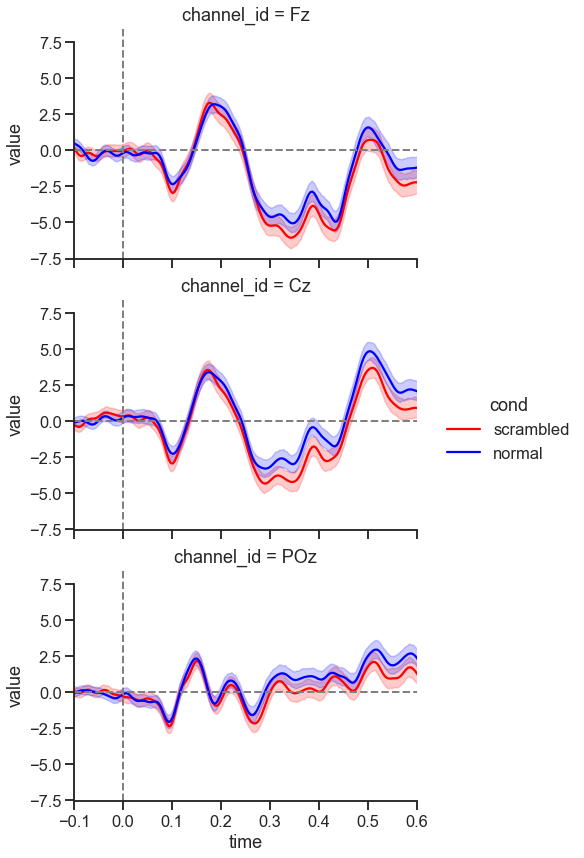

In [292]:
# Plot the responses for different events and regions
erp_plot = sns.relplot(x="time", y="value",ci=95,
             hue="cond",row="channel_id",kind="line",# style="event",
            palette = ['red', 'blue'],
                       legend=True,
             data=data2plot)

erp_plot.set(xlim=(-0.1, 0.6))
erp_plot.set(xticks=[-0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6])
erp_plot.fig.set_figwidth(8.27)
erp_plot.fig.set_figheight(11.7)


for ax in erp_plot.axes.flat:
    ax.axvline(0, ls='--', linewidth=2, color="gray")
    ax.axhline(0, ls='--', linewidth=2, color="gray")

sns.set(style="ticks")
sns.set_context('talk')
sns.color_palette("Paired")
sns.despine(offset=0, trim=True)

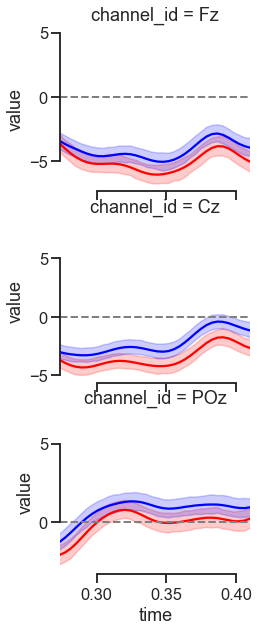

In [293]:
# Plot the responses for different events and regions
erp_plot = sns.relplot(x="time", y="value",ci=95,
             hue="cond",row="channel_id",kind="line",# style="event",
            palette = ['red', 'blue'],
            legend=False,
             data=data2plot, facet_kws={'sharey': False, 'sharex': True})

erp_plot.set(xlim=(0.274, 0.41))
erp_plot.fig.set_figwidth(3.27)
erp_plot.fig.set_figheight(8.27)


for ax in erp_plot.axes.flat:
    ax.axvline(0, ls='--', linewidth=2, color="gray")
    ax.axhline(0, ls='--', linewidth=2, color="gray")

sns.set(style="ticks")
sns.set_context('talk')
sns.color_palette("Paired")
sns.despine(offset=0, trim=True)

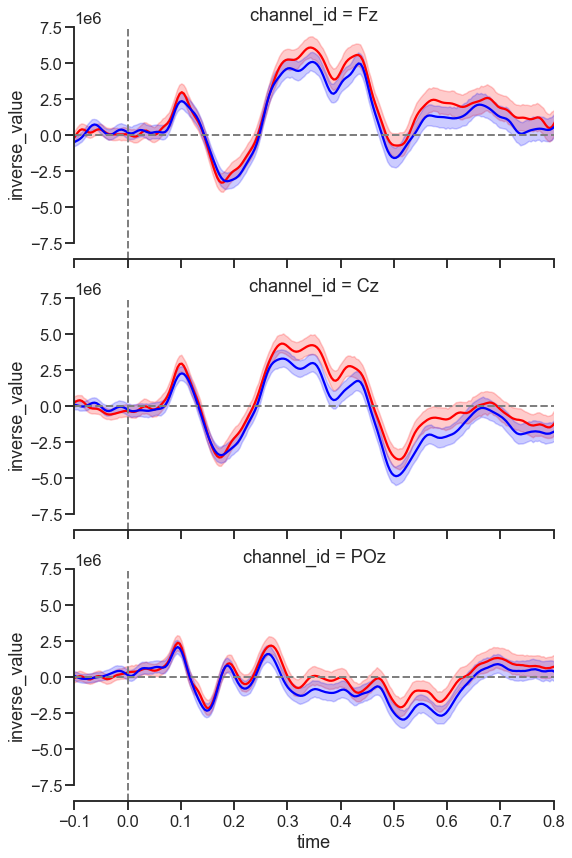

In [294]:
# Plot the responses for different events and regions
erp_plot = sns.relplot(x="time", y="inverse_value",ci=95,
             hue="cond",row="channel_id",kind="line",# style="event",
            palette = ['red', 'blue'],legend=False,
             data=data2plot)

erp_plot.set(xlim=(-0.1, 0.8))
erp_plot.set(xticks=[-0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6,0.7,0.8])
erp_plot.fig.set_figwidth(8.27)
erp_plot.fig.set_figheight(11.7)


for ax in erp_plot.axes.flat:
    ax.axvline(0, ls='--', linewidth=2, color="gray")
    ax.axhline(0, ls='--', linewidth=2, color="gray")

sns.set(style="ticks")
sns.set_context('talk')
sns.color_palette("Paired")
sns.despine(offset=0, trim=True)

In [295]:
data2plot['correct'].unique()

array([1], dtype=int64)

In [296]:
data2plot['item_condition'] = data2plot['item'].astype(str) + data2plot['cond']
data2plot.head(3)

,subj_idx,channel_id,condition,item,list,correct,timepoint,value,cond,inverse_value,time,item_condition
0,2,Fz,42,151,2,1,0,8.798245,scrambled,-8.798245e+06,-0.25,151scrambled
1,2,Fz,42,170,2,1,0,-5.207267,scrambled,5.207267e+06,-0.25,170scrambled
2,2,Fz,42,165,2,1,0,16.255260,scrambled,-1.625526e+07,-0.25,165scrambled


#### plot with OB1 lexicon activity

In [317]:
df = pd.read_pickle('E:/Projects/2020_reading/Sentencelexicon.pkl')
df['item_condition'] = df['item_nr'].astype(str) + df['condition']

bindict = dict(zip(df['item_condition'], df['bin']))
actdict = dict(zip(df['item_condition'], df['lexicon activity per cycle']))

data2plot['bin'] = data2plot['item_condition'].map(bindict)
data2plot['OB1 activity'] = data2plot['item_condition'].map(actdict)

In [318]:
lexiconN250 = data2plot[(data2plot['time']>.175) & (data2plot['time']< .25)].copy(deep=True)
lexiconN400 = data2plot[(data2plot['time']>.274) & (data2plot['time']< .41)].copy(deep=True)
lexiconP600 = data2plot[(data2plot['time']>.59) & (data2plot['time']< .61)].copy(deep=True)



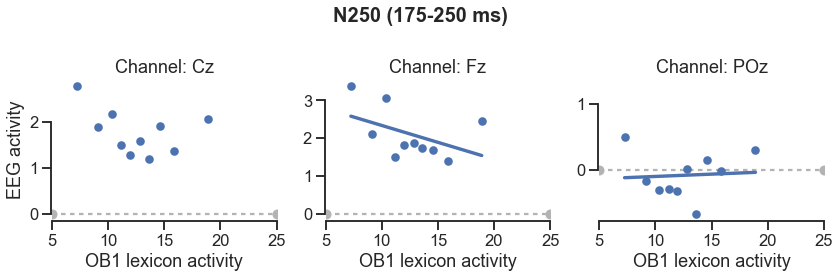

In [319]:
# Show the results of a linear regression within each dataset
sns.set(style="ticks")
sns.set_context('talk')
sns.color_palette("Paired")

g = sns.lmplot(x="OB1 activity", y="value", col="channel_id", data=lexiconN250.groupby(['bin', 'channel_id'],as_index=False).mean(),
           col_order= ['Cz', 'Fz', 'POz'],#col_wrap=2, 
               palette="muted", height=4 ,x_estimator=np.mean,fit_reg=True,ci=None,
           scatter_kws={"s": 50, "alpha": 1},sharey=False)

g.set(xticks=[5,10,15,20,25])#), yticks=[-2,-1,0,1,2,3])

g.fig.suptitle("N250 (175-250 ms)", size=20, weight="bold")


(g.map(plt.axhline, y=0, color=".7", dashes=(2, 2), zorder=0)
  .set_axis_labels("OB1 lexicon activity", "EEG activity")
  .set_titles("Channel: {col_name}")
  .tight_layout(w_pad=1))

sns.despine(offset=0.9, trim=True)

In [320]:
fz = lexiconN250[lexiconN250["channel_id"]=="Fz"].groupby(['bin'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(fz['OB1 activity'], fz['value'])


SpearmanrResult(correlation=-0.5030303030303029, pvalue=0.13833369839449197)

In [321]:
cz = lexiconN250[lexiconN250["channel_id"]=="Cz"].groupby(['bin'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(cz['OB1 activity'], cz['value'])

SpearmanrResult(correlation=-0.33333333333333326, pvalue=0.34659350708733405)

In [322]:
poz = lexiconN250[lexiconN250["channel_id"]=="POz"].groupby(['bin'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(poz['OB1 activity'], poz['value'])

SpearmanrResult(correlation=0.11515151515151514, pvalue=0.7514196523258484)

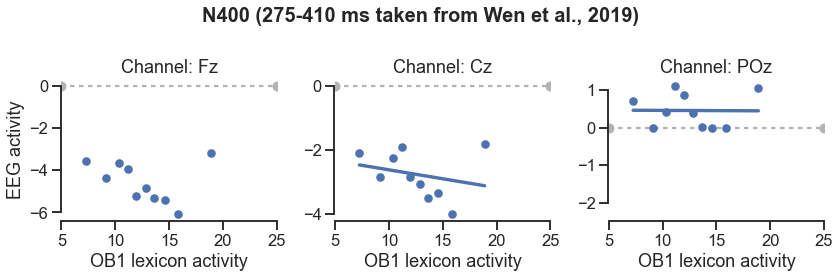

In [323]:
# Show the results of a linear regression within each dataset
sns.set(style="ticks")
sns.set_context('talk')
sns.color_palette("Paired")

g = sns.lmplot(x="OB1 activity", y="value", col="channel_id", data=lexiconN400.groupby(['bin', 'channel_id'],as_index=False).mean(),
           col_order= ['Fz', 'Cz', 'POz'],#col_wrap=2, 
               palette="muted", height=4 ,x_estimator=np.mean,fit_reg=True,ci=None,
           scatter_kws={"s": 50, "alpha": 1},sharey=False)

g.set(xticks=[5,10,15,20,25])#), yticks=[-2,-1,0,1,2,3])

g.fig.suptitle("N400 (275-410 ms taken from Wen et al., 2019)", size=20, weight="bold")


(g.map(plt.axhline, y=0, color=".7", dashes=(2, 2), zorder=0)
  .set_axis_labels("OB1 lexicon activity", "EEG activity")
  .set_titles("Channel: {col_name}")
  .tight_layout(w_pad=1))

sns.despine(offset=0.9, trim=True)

In [324]:
fz = lexiconN400[lexiconN400["channel_id"]=="Fz"].groupby(['bin'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(fz['OB1 activity'], fz['value'])


SpearmanrResult(correlation=-0.406060606060606, pvalue=0.24428229408662638)

In [325]:
cz = lexiconN400[lexiconN400["channel_id"]=="Cz"].groupby(['bin'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(cz['OB1 activity'], cz['value'])

SpearmanrResult(correlation=-0.35757575757575755, pvalue=0.3103760917056799)

In [326]:
poz = lexiconN400[lexiconN400["channel_id"]=="POz"].groupby(['bin'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(poz['OB1 activity'], poz['value'])

SpearmanrResult(correlation=-0.2121212121212121, pvalue=0.5563057751029299)

#### Our computational model of reading (OB1) reads in 25 ms timesteps. Therefore, downsample the data to 40 Hz: 

In [89]:
from scipy.io import loadmat
from scipy.signal import resample

excluded = [1,3,12] #list of participants to exclude 
all_subj = []
df = pd.DataFrame()

# selection of electrodes - 2 poolings 
elecs=['Fz','Cz','POz']
    
for electrode in elecs: 
    for p in tqdm(range(1,len(EEG_files)+1)):
        
        if p in excluded:  
            continue

        epochs = mne.read_epochs('E:/Projects/2020_reading/SentenceReading/EEG/pp_' + str(p) + '_0108_picks_baseline-epo.fif', verbose=None)
        data = np.squeeze(epochs.get_data(picks=electrode))
        downsampled_data = resample(data, 50,axis=1)

        cond_nr = epochs.metadata['eventcodes']
        stimulus = epochs.metadata['item_nr']
        stimlist = epochs.metadata['list']
        corr = epochs.metadata['correct']

        cond = pd.DataFrame(cond_nr)
        cond.reset_index(drop=True, inplace=True)
                
        stim = pd.DataFrame(stimulus)
        stim.reset_index(drop=True, inplace=True)
        
        counterbalance = pd.DataFrame(stimlist)
        counterbalance.reset_index(drop=True, inplace=True)
        
        cor = pd.DataFrame(corr)
        cor.reset_index(drop=True, inplace=True)
    
        df = pd.DataFrame(downsampled_data)
        df.reset_index(drop=True,inplace=True)
        df['channel_id'] = electrode
        df['subj_idx'] = p
        df['condition'] = cond['eventcodes']
        df['item'] = stim['item_nr']
        df['list'] = counterbalance['list']
        df['correct'] = cor['correct']
        df = df[df['correct']== 1]
        
        df = df.melt(id_vars=['subj_idx','channel_id','condition','item', 'list', 'correct'], var_name='timepoint')
    
        all_subj.append(df)
        
data = pd.concat(all_subj)        
data.head(10)


  0%|                                                   | 0/26 [00:00<?, ?it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_2_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
198 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated


  8%|███▎                                       | 2/26 [00:00<00:02,  8.44it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_4_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_5_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated


 19%|████████▎                                  | 5/26 [00:00<00:01, 10.57it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_6_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_7_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated


 27%|███████████▌                               | 7/26 [00:00<00:01, 12.05it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_8_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_9_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated


 35%|██████████████▉                            | 9/26 [00:00<00:01, 13.46it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_10_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_11_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated


 42%|█████████████████▊                        | 11/26 [00:00<00:01, 14.33it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_13_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_14_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated


 54%|██████████████████████▌                   | 14/26 [00:00<00:00, 16.57it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_15_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_16_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated


 62%|█████████████████████████▊                | 16/26 [00:00<00:00, 16.82it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_17_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_18_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated


 69%|█████████████████████████████             | 18/26 [00:01<00:00, 17.47it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_19_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_20_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated


 77%|████████████████████████████████▎         | 20/26 [00:01<00:00, 17.56it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_21_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_22_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_23_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 88%|█████████████████████████████████████▏    | 23/26 [00:01<00:00, 18.38it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_24_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_25_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_26_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

  0%|                                                   | 0/26 [00:00<?, ?it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_2_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
198 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_4_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_5_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items

 19%|████████▎                                  | 5/26 [00:00<00:00, 40.32it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_6_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_7_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_8_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items

 31%|█████████████▏                             | 8/26 [00:00<00:00, 33.80it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_9_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_10_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_11_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection ite

 42%|█████████████████▊                        | 11/26 [00:00<00:00, 29.88it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_13_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_14_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_15_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 58%|████████████████████████▏                 | 15/26 [00:00<00:00, 30.33it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_16_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_17_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_18_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 69%|█████████████████████████████             | 18/26 [00:00<00:00, 28.52it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_19_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_20_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_21_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 81%|█████████████████████████████████▉        | 21/26 [00:00<00:00, 27.12it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_22_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_23_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_24_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 92%|██████████████████████████████████████▊   | 24/26 [00:00<00:00, 25.62it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_25_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_26_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated


  0%|                                                   | 0/26 [00:00<?, ?it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_2_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
198 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_4_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_5_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items

 19%|████████▎                                  | 5/26 [00:00<00:00, 39.39it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_6_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_7_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_8_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items

 31%|█████████████▏                             | 8/26 [00:00<00:00, 32.79it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_9_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_10_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_11_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection ite

 42%|█████████████████▊                        | 11/26 [00:00<00:00, 30.26it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_13_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_14_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_15_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 58%|████████████████████████▏                 | 15/26 [00:00<00:00, 31.43it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_16_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_17_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_18_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
199 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 69%|█████████████████████████████             | 18/26 [00:00<00:00, 29.40it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_19_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_20_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_21_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 81%|█████████████████████████████████▉        | 21/26 [00:00<00:00, 27.69it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_22_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_23_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_24_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection it

 92%|██████████████████████████████████████▊   | 24/26 [00:00<00:00, 26.59it/s]

Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_25_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated
Reading E:/Projects/2020_reading/SentenceReading/EEG/pp_26_0108_picks_baseline-epo.fif ...
    Found the data of interest:
        t =    -250.00 ...     996.09 ms
        0 CTF compensation matrices available
200 matching events found
Applying baseline correction (mode: mean)
Adding metadata with 7 columns
0 projection items activated


100%|██████████████████████████████████████████| 26/26 [00:00<00:00, 27.78it/s]


,subj_idx,channel_id,condition,item,list,correct,timepoint,value
0,2,Fz,42,151,2,1,0,-1.274147e-05
1,2,Fz,42,170,2,1,0,-8.211017e-06
2,2,Fz,42,165,2,1,0,8.455953e-06
3,2,Fz,31,140,2,1,0,-3.191779e-07
4,2,Fz,12,12,2,1,0,-2.658534e-06
5,2,Fz,31,136,2,1,0,-9.417775e-06
6,2,Fz,12,22,2,1,0,1.113725e-05
7,2,Fz,42,160,2,1,0,7.957572e-06
8,2,Fz,12,2,2,1,0,-1.517551e-05
9,2,Fz,21,98,2,1,0,4.116796e-06


In [90]:
#event_dict = {'no/word': 65311, 'repetition/word': 65291, 'unrelated/word': 65301, 

data2plot = data.copy(deep=True)

data2plot['cond'] = data2plot['condition'].map({11: 'normal',21: 'normal',31: 'normal',41: 'normal', 12 : 'scrambled', 22 : 'scrambled', 32 : 'scrambled', 42 : 'scrambled'})
data2plot['value'] = data2plot['value']*1e6
data2plot['inverse_value']=data2plot['value']*-1e6

data2plot['time']=data2plot['timepoint'].astype(int)*(1.25/50)-0.25

#data2plot = data2plot[data2plot[timepoint]>64]

data2plot.head(100)

,subj_idx,channel_id,condition,item,list,correct,timepoint,value,cond,inverse_value,time
0,2,Fz,42,151,2,1,0,-12.741468,scrambled,1.274147e+07,-0.25
1,2,Fz,42,170,2,1,0,-8.211017,scrambled,8.211017e+06,-0.25
2,2,Fz,42,165,2,1,0,8.455953,scrambled,-8.455953e+06,-0.25
3,2,Fz,31,140,2,1,0,-0.319178,normal,3.191779e+05,-0.25
4,2,Fz,12,12,2,1,0,-2.658534,scrambled,2.658534e+06,-0.25
...,...,...,...,...,...,...,...,...,...,...,...
95,2,Fz,11,45,2,1,0,-6.954411,normal,6.954411e+06,-0.25
96,2,Fz,12,9,2,1,0,16.915683,scrambled,-1.691568e+07,-0.25
97,2,Fz,21,80,2,1,0,-0.551950,normal,5.519500e+05,-0.25
98,2,Fz,42,155,2,1,0,-5.514857,scrambled,5.514857e+06,-0.25


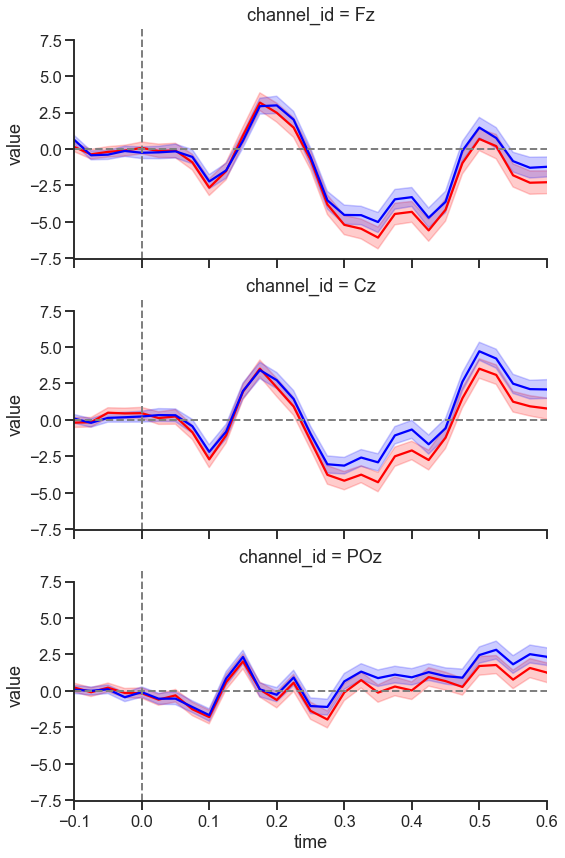

In [98]:
# Plot the responses for different events and regions
erp_plot = sns.relplot(x="time", y="value",ci=95,
             hue="cond",row="channel_id",kind="line",# style="event",
            palette = ['red', 'blue'],
                       legend=False,
             data=data2plot)

erp_plot.set(xlim=(-0.1, 0.6))
erp_plot.set(xticks=[-0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6])
erp_plot.fig.set_figwidth(8.27)
erp_plot.fig.set_figheight(11.7)


for ax in erp_plot.axes.flat:
    ax.axvline(0, ls='--', linewidth=2, color="gray")
    ax.axhline(0, ls='--', linewidth=2, color="gray")

sns.set(style="ticks")
sns.set_context('talk')
sns.color_palette("Paired")
sns.despine(offset=0, trim=True)

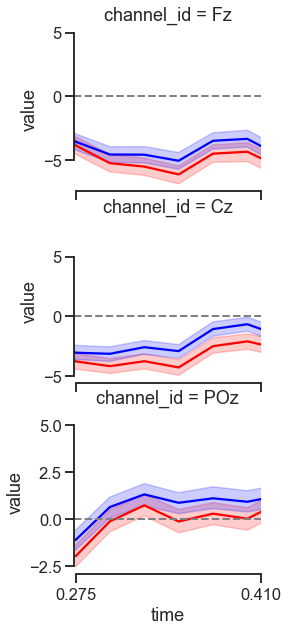

In [106]:
# Plot the responses for different events and regions
erp_plot = sns.relplot(x="time", y="value",ci=95,
             hue="cond",row="channel_id",kind="line",# style="event",
            palette = ['red', 'blue'],
            legend=False,
             data=data2plot, facet_kws={'sharey': False, 'sharex': True})

erp_plot.set(xlim=(0.274, 0.41))
erp_plot.fig.set_figwidth(3.27)
erp_plot.fig.set_figheight(8.27)

erp_plot.set(xticks=[0.275, 0.41])


for ax in erp_plot.axes.flat:
    ax.axvline(0, ls='--', linewidth=2, color="gray")
    ax.axhline(0, ls='--', linewidth=2, color="gray")

sns.set(style="ticks")
sns.set_context('talk')
sns.color_palette("Paired")
sns.despine(offset=0, trim=True)

#### plot with OB1 bigram activity

In [231]:
df = pd.read_pickle('E:/Projects/2020_reading/Sentencelexicon_ngrams.pkl')

print(df.head(3))
df['item_condition'] = df['item_nr'].astype(str) + df['condition']
print(df.head(3))


bindict = dict(zip(df['item_condition'], df['bin']))
actdict = dict(zip(df['item_condition'], df['ngrams']))

data2plot['bin'] = data2plot['item_condition'].map(bindict)
data2plot['OB1 activity'] = data2plot['item_condition'].map(actdict)

    trial             stimulus target condition  \
16      0   les vers sont loin    les    normal   
48      1  ces loups vont voir    ces    normal   
80      2     ton mec est vert    ton    normal   

                                                cycle  \
16  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...   
48  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...   
80  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...   

                          stimulus activity per cycle  \
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.781...   
48  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.672...   
80  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.914...   

                            target activity per cycle  \
16  [[0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0....   
48  [[0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0....   
80  [[0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0....   

                           lexicon activity per cycle  \
16  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.691.

In [232]:
lexiconN250 = data2plot[(data2plot['time']>.175) & (data2plot['time']< .25)].copy(deep=True)
lexiconN400 = data2plot[(data2plot['time']>.274) & (data2plot['time']< .41)].copy(deep=True)
lexiconP600 = data2plot[(data2plot['time']>.59) & (data2plot['time']< .61)].copy(deep=True)



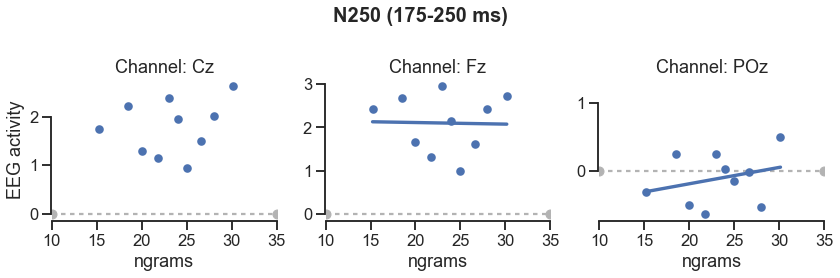

In [233]:
# Show the results of a linear regression within each dataset
sns.set(style="ticks")
sns.set_context('talk')
sns.color_palette("Paired")

g = sns.lmplot(x="OB1 activity", y="value", col="channel_id", data=lexiconN250.groupby(['bin', 'channel_id'],as_index=False).mean(),
           col_order= ['Cz', 'Fz', 'POz'],#col_wrap=2, 
               palette="muted", height=4 ,x_estimator=np.mean,fit_reg=True,ci=None,
           scatter_kws={"s": 50, "alpha": 1},sharey=False)

g.set(xticks=[10, 15,20,25,30, 35])#), yticks=[-2,-1,0,1,2,3])

g.fig.suptitle("N250 (175-250 ms)", size=20, weight="bold")


(g.map(plt.axhline, y=0, color=".7", dashes=(2, 2), zorder=0)
  .set_axis_labels("ngrams", "EEG activity")
  .set_titles("Channel: {col_name}")
  .tight_layout(w_pad=1))

sns.despine(offset=0.9, trim=True)

In [234]:
fz = lexiconN250[lexiconN250["channel_id"]=="Fz"].groupby(['bin'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(fz['OB1 activity'], fz['value'])


SpearmanrResult(correlation=-0.05454545454545454, pvalue=0.8810361811618526)

In [235]:
cz = lexiconN250[lexiconN250["channel_id"]=="Cz"].groupby(['bin'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(cz['OB1 activity'], cz['value'])

SpearmanrResult(correlation=0.22424242424242422, pvalue=0.5334005612725948)

In [236]:
poz = lexiconN250[lexiconN250["channel_id"]=="POz"].groupby(['bin'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(poz['OB1 activity'], poz['value'])

SpearmanrResult(correlation=0.18787878787878787, pvalue=0.603217610029209)

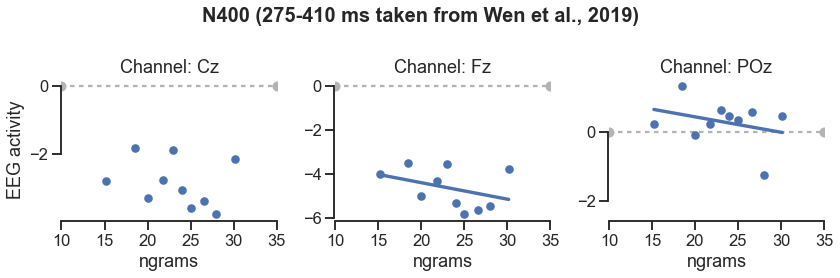

In [237]:
# Show the results of a linear regression within each dataset
sns.set(style="ticks")
sns.set_context('talk')
sns.color_palette("Paired")

g = sns.lmplot(x="OB1 activity", y="value", col="channel_id", data=lexiconN400.groupby(['bin', 'channel_id'],as_index=False).mean(),
           col_order= ['Cz', 'Fz', 'POz'],#col_wrap=2, 
               palette="muted", height=4 ,x_estimator=np.mean,fit_reg=True,ci=None,
           scatter_kws={"s": 50, "alpha": 1},sharey=False)

g.set(xticks=[10, 15,20,25,30, 35])#), yticks=[-2,-1,0,1,2,3])

g.fig.suptitle("N400 (275-410 ms taken from Wen et al., 2019)", size=20, weight="bold")


(g.map(plt.axhline, y=0, color=".7", dashes=(2, 2), zorder=0)
  .set_axis_labels("ngrams", "EEG activity")
  .set_titles("Channel: {col_name}")
  .tight_layout(w_pad=1))

sns.despine(offset=0.9, trim=True)

In [238]:
fz = lexiconN400[lexiconN400["channel_id"]=="Fz"].groupby(['bin'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(fz['OB1 activity'], fz['value'])


SpearmanrResult(correlation=-0.4545454545454545, pvalue=0.186904810349332)

In [239]:
cz = lexiconN400[lexiconN400["channel_id"]=="Cz"].groupby(['bin'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(cz['OB1 activity'], cz['value'])

SpearmanrResult(correlation=-0.41818181818181815, pvalue=0.22911284098281892)

In [240]:
poz = lexiconN400[lexiconN400["channel_id"]=="POz"].groupby(['bin'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(poz['OB1 activity'], poz['value'])

SpearmanrResult(correlation=-0.0303030303030303, pvalue=0.9337729580941466)

#### plot with OB1 nr of letters 

In [241]:
df = pd.read_pickle('E:/Projects/2020_reading/Sentencelexicon_nletters.pkl')

print(df.head(3))
df['item_condition'] = df['item_nr'].astype(str) + df['condition']
print(df.head(3))


bindict = dict(zip(df['item_condition'], df['nletters']))
actdict = dict(zip(df['item_condition'], df['nletters']))

data2plot['nletters'] = data2plot['item_condition'].map(bindict)
data2plot['OB1 activity'] = data2plot['item_condition'].map(actdict)

   trial             stimulus target condition  \
0      0   les vers sont loin    les    normal   
1      1  ces loups vont voir    ces    normal   
2      2     ton mec est vert    ton    normal   

                                               cycle  \
0  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...   
1  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...   
2  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...   

                         stimulus activity per cycle  \
0  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.781...   
1  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.672...   
2  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.914...   

                           target activity per cycle  \
0  [[0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0....   
1  [[0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0....   
2  [[0.0], [0.0], [0.0], [0.0], [0.0], [0.0], [0....   

                          lexicon activity per cycle  \
0  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 9.691...   
1  [0.0, 0.0

In [242]:
lexiconN250 = data2plot[(data2plot['time']>.175) & (data2plot['time']< .25)].copy(deep=True)
lexiconN400 = data2plot[(data2plot['time']>.274) & (data2plot['time']< .41)].copy(deep=True)
lexiconP600 = data2plot[(data2plot['time']>.59) & (data2plot['time']< .61)].copy(deep=True)



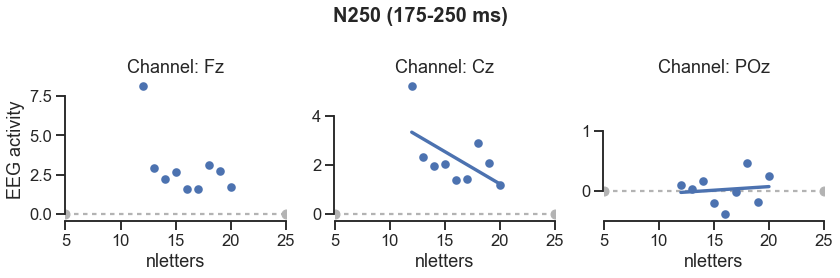

In [243]:
# Show the results of a linear regression within each dataset
sns.set(style="ticks")
sns.set_context('talk')
sns.color_palette("Paired")

g = sns.lmplot(x="OB1 activity", y="value", col="channel_id", data=lexiconN250.groupby(['nletters', 'channel_id'],as_index=False).mean(),
           col_order= ['Fz', 'Cz', 'POz'],#col_wrap=2, 
               palette="muted", height=4 ,x_estimator=np.mean,fit_reg=True,ci=None,
           scatter_kws={"s": 50, "alpha": 1},sharey=False)

g.set(xticks=[5, 10, 15,20,25])#), yticks=[-2,-1,0,1,2,3])

g.fig.suptitle("N250 (175-250 ms)", size=20, weight="bold")


(g.map(plt.axhline, y=0, color=".7", dashes=(2, 2), zorder=0)
  .set_axis_labels("nletters", "EEG activity")
  .set_titles("Channel: {col_name}")
  .tight_layout(w_pad=1))

sns.despine(offset=0.9, trim=True)

In [244]:
fz = lexiconN250[lexiconN250["channel_id"]=="Fz"].groupby(['nletters'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(fz['OB1 activity'], fz['value'])


SpearmanrResult(correlation=-0.38333333333333336, pvalue=0.30849527238037144)

In [245]:
cz = lexiconN250[lexiconN250["channel_id"]=="Cz"].groupby(['nletters'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(cz['OB1 activity'], cz['value'])

SpearmanrResult(correlation=-0.48333333333333334, pvalue=0.18746985521554207)

In [246]:
poz = lexiconN250[lexiconN250["channel_id"]=="POz"].groupby(['nletters'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(poz['OB1 activity'], poz['value'])

SpearmanrResult(correlation=0.13333333333333333, pvalue=0.7323675052362975)

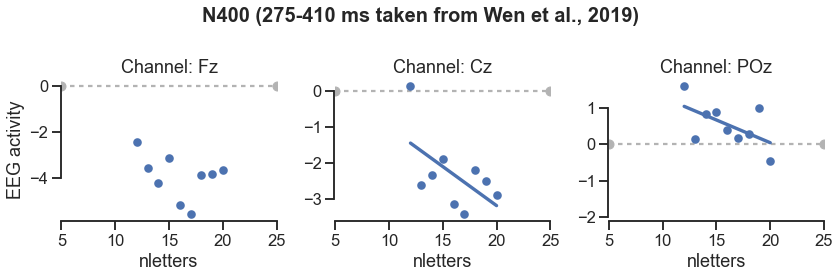

In [247]:
# Show the results of a linear regression within each dataset
sns.set(style="ticks")
sns.set_context('talk')
sns.color_palette("Paired")

g = sns.lmplot(x="OB1 activity", y="value", col="channel_id", data=lexiconN400.groupby(['nletters', 'channel_id'],as_index=False).mean(),
           col_order= ['Fz', 'Cz', 'POz'],#col_wrap=2, 
               palette="muted", height=4 ,x_estimator=np.mean,fit_reg=True,ci=None,
           scatter_kws={"s": 50, "alpha": 1},sharey=False)

g.set(xticks=[5, 10, 15,20,25])#), yticks=[-2,-1,0,1,2,3])

g.fig.suptitle("N400 (275-410 ms taken from Wen et al., 2019)", size=20, weight="bold")


(g.map(plt.axhline, y=0, color=".7", dashes=(2, 2), zorder=0)
  .set_axis_labels("nletters", "EEG activity")
  .set_titles("Channel: {col_name}")
  .tight_layout(w_pad=1))

sns.despine(offset=0.9, trim=True)

In [248]:
fz = lexiconN400[lexiconN400["channel_id"]=="Fz"].groupby(['nletters'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(fz['OB1 activity'], fz['value'])


SpearmanrResult(correlation=-0.38333333333333336, pvalue=0.30849527238037144)

In [249]:
cz = lexiconN400[lexiconN400["channel_id"]=="Cz"].groupby(['nletters'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(cz['OB1 activity'], cz['value'])

SpearmanrResult(correlation=-0.43333333333333335, pvalue=0.24395243588005167)

In [250]:
poz = lexiconN400[lexiconN400["channel_id"]=="POz"].groupby(['nletters'],as_index=False).mean().copy(deep=True)
scipy.stats.spearmanr(poz['OB1 activity'], poz['value'])

SpearmanrResult(correlation=-0.3666666666666667, pvalue=0.33173980143301507)